<a href="https://colab.research.google.com/github/ranggawpp/Tugas-Akhir/blob/main/TugasAkhir_Siang_LSTM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Analisa Performa Optimizer Algoritma Pembelajaran Mesin Dalam Prediksi Iradiasi Matahari Berdasarkan Luas Penerangan (Lux) Di Atap Gedung Jakarta Selatan**
* * *
Notebook ini menganalisis performa algoritma pembelajaran mesin LSTM dalam memprediksi iradiasi matahari berdasarkan luas penerangan (Lux) di Atap Gedung Jakarta Selatan. Analisis ini dibagi menjadi beberapa tahap utama:

1.  **Pemuatan Dataset**: Memuat data dari file Excel.
2.  **Exploratory Data Analysis (EDA)**: Memahami karakteristik data, termasuk deskripsi statistik, identifikasi missing value dan outlier, serta analisis distribusi.
3.  **Perancangan Model**: Mendefinisikan arsitektur model LSTM yang akan digunakan.
4.  **Pra-pemrosesan Data**: Menangani missing value, mengubah data Lux menjadi Iradiasi Matahari, normalisasi data, dan membagi data menjadi set pelatihan, validasi, dan pengujian.
5.  **Pelatihan Model**: Melatih model LSTM dengan berbagai konfigurasi optimizer (SGD, RMSProp, Adam).
6.  **Evaluasi Kinerja Model**: Mengevaluasi performa model yang dilatih menggunakan metrik MAE, RMSE, dan MAPE.
7.  **Pemilihan Model Terbaik**: Membandingkan kinerja model dengan berbagai optimizer untuk memilih yang terbaik.
8.  **Tambahan**: Mencoba model terbaik untuk memprediksi dataset baru.

## 1. Pemuatan Dataset
Tahap awal ini berfokus pada persiapan lingkungan kerja. Proses ini mencakup impor library esensial yang akan digunakan seperti pandas, numpy, matplotlib, dan tensorflow. Selanjutnya, dataset utama (Data_Siang_Processed.xlsx) dimuat dari Google Drive, dan kolom 'Tanggal' langsung ditetapkan sebagai index berformat datetime untuk memfasilitasi analisis deret waktu.

In [ ]:
import warnings

# Data manipulation and analysis
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose

# Visualization
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

# Machine Learning - Preprocessing and Metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Deep Learning - TensorFlow and Keras
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, LSTM, Input # Import Input layer
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Adadelta, Adagrad, Adamax, Nadam, Ftrl
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard

# Google Colab specific
from google.colab import drive

# Ignore specific warnings
warnings.filterwarnings('ignore', category=UserWarning)

In [ ]:
# Menghubungkan Drive dengan Colab
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Memuat dataset sebagai dataframe dari Google Drive
df = pd.read_excel('/content/drive/MyDrive/Tugas_Akhir/Data_Siang_Processed.xlsx', index_col='Tanggal', parse_dates=True)

# Melihat sampel dari data untuk verifikasi pemuatan
display(df.head())
display(df.tail())

,No,Bulan,Sudut,Lux,Cuaca,Tampak
Tanggal,,,,,,
2023-03-01,1,March,0,605.0,Hujan,Utara
2023-03-01,2,March,15,1166.0,Hujan,Utara
2023-03-01,3,March,30,1727.0,Hujan,Utara
2023-03-01,4,March,45,2288.0,Hujan,Utara
2023-03-01,5,March,60,2848.0,Hujan,Utara


,No,Bulan,Sudut,Lux,Cuaca,Tampak
Tanggal,,,,,,
2024-02-29,4754,February,120,2922.0,Hujan,Utara
2024-02-29,4755,February,135,2542.0,Hujan,Utara
2024-02-29,4756,February,150,2162.0,Hujan,Utara
2024-02-29,4757,February,165,1781.0,Hujan,Utara
2024-02-29,4758,February,180,1401.0,Hujan,Utara


Output dari sel kode ini menampilkan lima baris pertama dan lima baris terakhir dari DataFrame `df` yang dimuat dari file Excel.

*   Terlihat bahwa data dimuat dengan kolom 'Tanggal' sebagai index, dan tipe datanya sudah berupa datetime.
*   Terdapat kolom-kolom lain seperti 'No', 'Bulan', 'Sudut', 'Lux', 'Cuaca', dan 'Tampak'.
*   Jumlah total baris data adalah 4758.
*   Ini memberikan gambaran awal tentang struktur data dan memastikan data berhasil dimuat dengan benar.

##2. Exploratory Data Analysis
Pada tahap Exploratory Data Analysis (EDA) ini, dilakukan investigasi awal untuk memahami karakteristik dan struktur dataset. Proses ini mencakup pemeriksaan tipe data dan nilai non-null (df.info()), analisis statistik deskriptif (df.describe()) untuk melihat sebaran data, hingga visualisasi menggunakan boxplot untuk mengidentifikasi pencilan (outliers) serta pola-pola temporal yang mungkin ada.

### 2.1 Deskripsi Variabel
Tahap ini menampilkan informasi ringkas tentang DataFrame, termasuk jumlah entri non-null di setiap kolom dan tipe data masing-masing kolom. Ini membantu mengidentifikasi kolom mana yang mungkin memiliki missing value dan memahami tipe data yang ada.

In [ ]:
# Menampilkan informasi ringkas tentang DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4758 entries, 2023-03-01 to 2024-02-29
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   No      4758 non-null   int64  
 1   Bulan   4758 non-null   object 
 2   Sudut   4758 non-null   int64  
 3   Lux     4056 non-null   float64
 4   Cuaca   4758 non-null   object 
 5   Tampak  4758 non-null   object 
dtypes: float64(1), int64(2), object(3)
memory usage: 260.2+ KB


Output dari df.info() menunjukkan dataset mentah terdiri dari 4.758 entri dari 1 Maret 2023 hingga 29 Februari 2024. Dari 6 kolom yang ada, hanya kolom 'Lux' yang tidak lengkap, dengan 702 data hilang (4.758 total entri - 4.056 non-null).

### 2.2 Deskripsi Statistik
Tahap ini menghasilkan statistik deskriptif (mean, std, min, max, quartile) untuk kolom-kolom numerik. Ini memberikan gambaran umum tentang sebaran nilai dalam data.

In [ ]:
# Menghasilkan statistik deskriptif untuk kolom numerik
df.describe()

,No,Sudut,Lux
count,4758.00000,4758.00000,4056.000000
mean,2379.50000,90.00000,35229.498521
std,1373.66062,56.13076,27447.235479
min,1.00000,0.00000,203.000000
25%,1190.25000,45.00000,15775.000000
50%,2379.50000,90.00000,28595.500000
75%,3568.75000,135.00000,51325.500000
max,4758.00000,180.00000,155000.000000


Output ini menyajikan statistik deskriptif untuk kolom-kolom numerik ('No', 'Sudut', 'Lux'):

*   **count**: Jumlah entri non-null. Sesuai dengan `df.info()`, 'Lux' memiliki count yang lebih rendah (4056) karena missing value.
*   **mean**: Rata-rata nilai.
*   **std**: Standar deviasi, mengukur sebaran data.
*   **min**: Nilai minimum.
*   **25%, 50% (median), 75%**: Kuartil, menunjukkan distribusi data.
*   **max**: Nilai maksimum.

Dari statistik 'Lux', terlihat rentang nilai yang cukup besar (min 203, max 155000) dengan standar deviasi yang tinggi (27447), menunjukkan variabilitas yang signifikan dalam intensitas cahaya.

In [ ]:
# Melakukan deskripsi statistik untuk kolom 'Lux' yang dikelompokkan berdasarkan 'Sudut'
deskripsi_per_sudut = df.groupby('Sudut')['Lux'].describe()
display(deskripsi_per_sudut)

,count,mean,std,min,25%,50%,75%,max
Sudut,,,,,,,,
0,312.0,19746.701923,12852.475076,203.0,14311.25,18944.0,25571.00,75420.0
15,312.0,29987.810897,19816.058317,364.0,17804.75,29987.5,40014.00,95460.0
30,312.0,37373.032051,24358.462737,499.0,20159.25,37579.5,52655.50,115900.0
45,312.0,43701.080128,29815.289307,635.0,20124.50,40759.5,67860.00,130800.0
60,312.0,49789.291667,33101.582762,771.0,22162.75,50127.5,76296.25,135700.0
75,312.0,49794.064103,34947.450620,706.0,21100.50,45046.0,78690.00,151700.0
90,312.0,46714.253205,33904.516128,613.0,19620.25,41105.0,71950.25,155000.0
105,312.0,44608.560897,30480.907237,659.0,20244.25,41131.0,67929.25,129100.0
120,312.0,40625.000000,26721.729123,590.0,21277.00,40182.0,59195.00,113600.0


Analisis per sudut menunjukkan rata-rata (mean) tertinggi terjadi pada sudut 75°, sedangkan nilai maksimum tunggal tertinggi terjadi pada sudut 90°. Ini mengindikasikan sudut tersebut paling optimal untuk menangkap intensitas cahaya.

In [ ]:
# Mengambil subset data di mana 'Sudut' adalah 75
df75 = df.query('Sudut == 75').copy() # Gunakan .copy() untuk menghindari SettingWithCopyWarning

Berdasarkan analisis sebelumnya, data dari sudut 75° dipilih untuk pemodelan karena menunjukkan rata-rata intensitas cahaya dan variabilitas tertinggi. DataFrame df75 dibuat, berisi 366 data harian yang akan menjadi fokus analisis selanjutnya.

### 2.3 Identifikasi Missing Value dan Outlier
Tahap ini menghitung jumlah missing value (nilai kosong) di setiap kolom pada DataFrame `df75`, dan membuat boxplot dari kolom 'Lux' pada `df75`. Boxplot adalah cara visual untuk melihat distribusi data dan mengidentifikasi potensi outlier (nilai-nilai yang jauh dari sebagian besar data).

In [ ]:
# Check for missing values in df75
print("Rows with any missing values in df75:")
display(df75[df75.isnull().any(axis=1)])
print("\nTotal missing values per column in df75:")
print(df75.isnull().sum())

Rows with any missing values in df75:


,No,Bulan,Sudut,Lux,Cuaca,Tampak
Tanggal,,,,,,
2023-03-04,45,March,75,NaN,Berawan,Utara
2023-03-23,292,March,75,NaN,Cerah Berawan,Utara
2023-03-25,318,March,75,NaN,Berawan,Utara
2023-04-09,513,April,75,NaN,Cerah Berawan,Utara
2023-04-18,630,April,75,NaN,Cerah Berawan,Utara
2023-04-22,682,April,75,NaN,Cerah,Utara
2023-05-01,799,May,75,NaN,Cerah Berawan,Utara
2023-05-23,1085,May,75,NaN,Cerah Berawan,Utara
2023-06-17,1410,June,75,NaN,Cerah Berawan,Utara



Total missing values per column in df75:
No         0
Bulan      0
Sudut      0
Lux       54
Cuaca      0
Tampak     0
dtype: int64


Pemeriksaan pada df75 mengonfirmasi adanya 54 nilai yang hilang (NaN), yang semuanya terdapat pada kolom 'Lux'. Data hilang ini setara dengan ~14.7% dari dataset df75 dan perlu ditangani sebelum pemodelan.

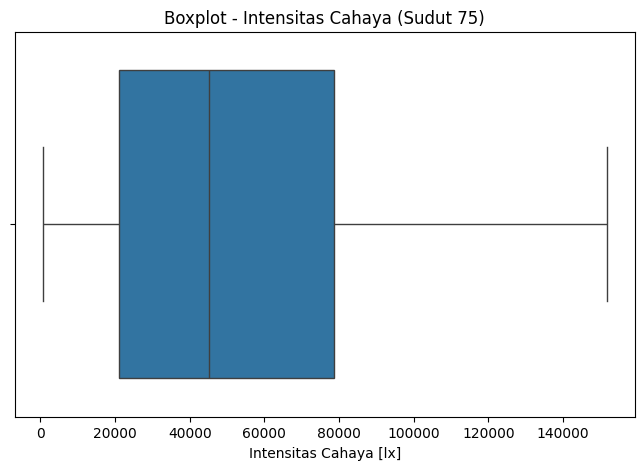

In [ ]:
# Create a boxplot to visualize outliers in 'Lux' column of df75
plt.figure(figsize=(8,5))
sns.boxplot(data=df75, x='Lux')
plt.xlabel('Intensitas Cahaya [lx]')
plt.title(f'Boxplot - Intensitas Cahaya (Sudut 75)') # Add angle to title
plt.show() # Ensure plot is displayed

Visualisasi boxplot menunjukkan distribusi nilai 'Lux' yang sangat lebar. Keberadaan titik-titik di luar "kumis" (whisker) mengindikasikan adanya pencilan (outliers), yang dalam konteks ini merepresentasikan kondisi cuaca ekstrem (sangat cerah atau sangat mendung) dan akan dipertahankan untuk melatih model yang robust.

### 2.4 Analisis Distribusi Data
Tahap ini menganalisis distribusi intensitas cahaya (Lux) berdasarkan bulan/tahun dan hari dalam seminggu menggunakan boxplot untuk mengidentifikasi pola musiman atau harian.

#### 2.4.1 Day month distribution

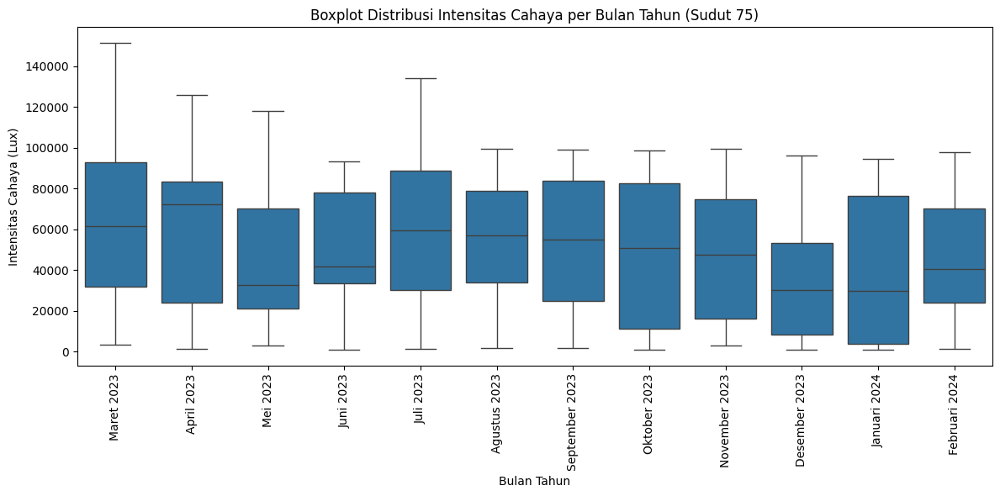

In [ ]:
# Prepare data for day/month distribution analysis
# Use a copy to avoid modifying the original df75 in place during this analysis part
data_eda = df75.copy()

# Extract year, month, and create year_month string
data_eda['year'] = data_eda.index.year
data_eda['month'] = data_eda.index.month
data_eda['year_month'] = data_eda.index.strftime('%Y-%m') # Use strftime for consistent format

# Filter data for years >= 2023 (assuming relevant data starts then)
data_plot_month = data_eda[data_eda['year'] >= 2023].reset_index().sort_values(by='Tanggal')

# Create a dictionary to map month numbers to Indonesian month names
month_mapping = {
    1: 'Januari', 2: 'Februari', 3: 'Maret', 4: 'April', 5: 'Mei', 6: 'Juni',
    7: 'Juli', 8: 'Agustus', 9: 'September', 10: 'Oktober', 11: 'November', 12: 'Desember'
}

# Apply the mapping to create the 'month_year' column for plotting labels
# Ensure year_month is treated as string for splitting
data_plot_month['month_year_label'] = data_plot_month['year_month'].apply(
    lambda x: f"{month_mapping[int(x.split('-')[1])]} {x.split('-')[0]}"
)

# Create a boxplot for monthly/yearly distribution
plt.figure(figsize=(12, 6))
plt.title('Boxplot Distribusi Intensitas Cahaya per Bulan Tahun (Sudut 75)')
plt.xticks(rotation=90)

# Use 'month_year_label' for x-axis and data_plot_month as data source
sns.boxplot(x='month_year_label', y='Lux', data=data_plot_month)
plt.ylabel('Intensitas Cahaya (Lux)')
plt.xlabel('Bulan Tahun')
plt.tight_layout() # Adjust layout to prevent labels overlapping
plt.show()

Boxplot distribusi bulanan mengonfirmasi adanya pola musiman dalam data, terlihat dari perubahan median dan rentang data antar bulan.

#### 2.4.2 Day distribution

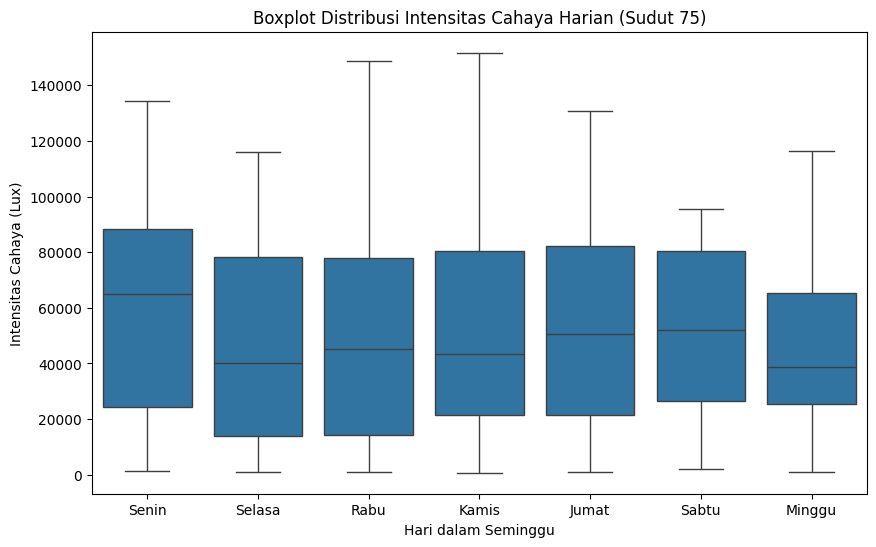

In [ ]:
# Prepare data for day of the week distribution analysis
# Continue using data_eda from the previous cell

# Extract day of the week and full day name
data_eda['day_of_week'] = data_eda.index.dayofweek  # 0: Monday, ..., 6: Sunday
data_eda['day_str'] = data_eda.index.strftime('%A')  # Full day name

# Mapping English day names to Indonesian
day_mapping = {
    'Monday': 'Senin', 'Tuesday': 'Selasa', 'Wednesday': 'Rabu',
    'Thursday': 'Kamis', 'Friday': 'Jumat', 'Saturday': 'Sabtu', 'Sunday': 'Minggu'
}

# Apply the mapping to create the 'day_str_id' column
data_eda['day_str_id'] = data_eda['day_str'].map(day_mapping)

# Sort data by day of the week (for correct order in plot)
data_plot_day = data_eda.sort_values(by=['day_of_week'])

# Create the boxplot for daily distribution
plt.figure(figsize=(10, 6))
plt.title('Boxplot Distribusi Intensitas Cahaya Harian (Sudut 75)') # Add angle to title
plt.xlabel('Hari dalam Seminggu')
plt.ylabel('Intensitas Cahaya (Lux)')

# Use 'day_str_id' for x-axis and data_plot_day as data source
sns.boxplot(x='day_str_id', y='Lux', data=data_plot_day)

plt.show()

Sementara itu, boxplot harian menunjukkan variasi yang tidak terlalu signifikan antar hari kerja, dengan pola yang paling menonjol adalah nilai Lux yang cenderung lebih rendah pada hari Minggu.

Boxplot ini menunjukkan bahwa, pada sudut 75 derajat, distribusi intensitas cahaya tidak menunjukkan pola variasi yang sangat kuat antar hari dalam seminggu, dibandingkan dengan variasi musiman bulanan/tahunan.

## 3. Perancangan Model
Bagian ini mendefinisikan arsitektur model Stacked LSTM yang akan menjadi fondasi untuk seluruh eksperimen. Sebuah fungsi, create_lstm_model, dibuat untuk membangun struktur model secara konsisten. Arsitektur ini terdiri dari tumpukan lapisan LSTM yang diikuti oleh beberapa lapisan fully-connected (Dense) untuk menghasilkan prediksi akhir. Ringkasan model (model.summary()) ditampilkan untuk memverifikasi setiap lapisan, bentuk output, dan jumlah parameter yang akan dilatih.

In [ ]:
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model # Import Model for functional API if needed, although Sequential is used here

def create_lstm_model(input_shape):
    """Defines the LSTM model architecture."""
    model = Sequential([
        # Use Input layer explicitly to define input shape
        Input(shape=input_shape),
        LSTM(128, return_sequences=True),
        LSTM(64, return_sequences=True),
        LSTM(32, return_sequences=False),
        Dense(32, activation="relu"),
        Dense(16, activation="relu"),
        Dense(1)
    ])
    return model

In [ ]:
sample = create_lstm_model((7, 1))
sample.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 7, 128)         │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 7, 64)          │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 129,985 (507.75 KB)

 Trainable params: 129,985 (507.75 KB)

 Non-trainable params: 0 (0.00 B)

Arsitektur model yang dirancang adalah Stacked LSTM yang terdiri dari 3 lapisan LSTM (128, 64, 32 unit) dan lapisan fully-connected sebagai head regresi. Total parameter yang dapat dilatih dari sample arsitektur ini adalah 135.617. Arsitektur yang sama ini digunakan secara konsisten untuk semua skenario pengujian optimizer.

## 4. Pra-pemrosesan Data
Tahap ini bertujuan untuk mengubah data mentah menjadi format yang bersih dan siap pakai untuk model LSTM. Rangkaian prosesnya meliputi beberapa langkah kunci:

1. Penanganan Missing Values: Mengisi data yang hilang pada kolom 'Lux' menggunakan metode imputasi.
2. Visualisasi & Dekomposisi: Menganalisis data secara visual sebagai deret waktu dan memisahkannya menjadi komponen tren dan musiman.
3. Seleksi Fitur & Konversi: Memilih fitur yang relevan (pendekatan univariat) dan mengonversi satuan dari Lux ke W/m².
4. Normalisasi & Segmentasi: Mengubah skala data ke rentang [0, 1] dan menstrukturkannya ke dalam format sliding window yang dibutuhkan oleh LSTM.

### 4.1 Penanganan Missing Value dan Outlier
*   Fungsi `fill_missing_lux` mengisi nilai 'Lux' yang kosong. Dalam implementasi ini, missing value diisi dengan angka acak dalam rentang minimum dan maksimum nilai Lux untuk kombinasi 'Sudut', 'Cuaca', dan 'Bulan' yang sama. Jika data untuk kombinasi tersebut tidak cukup, akan menggunakan rentang minimum dan maksimum dari 'Sudut' dan 'Cuaca' saja.
*   Setelah pemanggilan fungsi, dilakukan pengecekan kembali untuk memastikan tidak ada missing value yang tersisa.
*   Boxplot kembali dibuat untuk melihat distribusi 'Lux' setelah missing value ditangani, untuk melihat apakah ada perubahan signifikan pada distribusi atau outlier.

In [ ]:
def fill_missing_lux(df):
    """
    Fills missing 'Lux' values in a DataFrame based on group-wise statistics.

    Missing values are filled with a random integer within the min/max range
    of 'Lux' for the corresponding 'Sudut', 'Cuaca', and 'Bulan' combination.
    If min/max are not available for a specific month, the min/max for the
    'Sudut' and 'Cuaca' combination across all months is used.

    Args:
        df (pd.DataFrame): The input DataFrame with a 'Lux' column that may
                           contain missing values.

    Returns:
        pd.DataFrame: The DataFrame with missing 'Lux' values filled.
    """
    # Calculate statistics for each combination of 'Sudut', 'Cuaca', and 'Bulan'
    results = {}
    overall_results = {}

    # Calculate overall min/max for each 'Sudut' and 'Cuaca'
    for sudut in df['Sudut'].unique():
        for cuaca in df['Cuaca'].unique():
            overall_subset = df[(df['Sudut'] == sudut) & (df['Cuaca'] == cuaca)]
            overall_min_val = overall_subset['Lux'].min()
            overall_max_val = overall_subset['Lux'].max()

            overall_results[(sudut, cuaca)] = {
                'Min': overall_min_val,
                'Max': overall_max_val,
            }

            # Calculate min/max for each 'Sudut', 'Cuaca', and 'Bulan'
            for bulan in df['Bulan'].unique():
                subset = overall_subset[overall_subset['Bulan'] == bulan]
                min_val = subset['Lux'].min()
                max_val = subset['Lux'].max()

                results[(sudut, cuaca, bulan)] = {
                    'Min': min_val,
                    'Max': max_val,
                }

    # Fill missing 'Lux' values using .loc to avoid SettingWithCopyWarning
    for index, row in df.iterrows():
        if pd.isna(row['Lux']):
            sudut = row['Sudut']
            cuaca = row['Cuaca'].strip() # Ensure no leading/trailing whitespace
            bulan = row['Bulan']

            min_val = results.get((sudut, cuaca, bulan), {}).get('Min')
            max_val = results.get((sudut, cuaca, bulan), {}).get('Max')

            # Use overall min/max if min/max are not available for the specific month
            # or if min and max are the same (no range to pick from)
            if pd.isna(min_val) or pd.isna(max_val) or min_val == max_val:
                min_val = overall_results.get((sudut, cuaca), {}).get('Min')
                max_val = overall_results.get((sudut, cuaca), {}).get('Max')

            # Fill with a random integer within the valid range if available
            if pd.notna(min_val) and pd.notna(max_val) and min_val != max_val:
                 # Use .loc for safe assignment
                df.loc[index, 'Lux'] = np.random.randint(min_val, max_val + 1)
            elif pd.notna(min_val):
                 # If only min is available (and min==max was handled), use min
                 df.loc[index, 'Lux'] = min_val
            elif pd.notna(max_val):
                 # If only max is available (shouldn't happen if min is missing), use max
                 df.loc[index, 'Lux'] = max_val
            # If still no valid range (e.g., no data for this combo at all),
            # the Lux value remains NaN (or could be filled with a global mean/median if desired)
            # The current logic leaves it as NaN if no range is found, which might be acceptable
            # or might need further refinement based on requirements.

    return df

In [ ]:
df75 = fill_missing_lux(df75)

In [ ]:
# Check for missing values in each DataFrame
print(df75[df75.isnull().any(axis=1)], '\n')
print(df75.isnull().sum())

Empty DataFrame
Columns: [No, Bulan, Sudut, Lux, Cuaca, Tampak]
Index: [] 

No        0
Bulan     0
Sudut     0
Lux       0
Cuaca     0
Tampak    0
dtype: int64


Ke-54 nilai 'Lux' yang hilang diisi menggunakan metode imputasi acak bersyarat. Nilai baru di-generate secara acak dari rentang [min, max] nilai Lux lain dengan kombinasi 'Bulan' dan 'Cuaca' yang sama. Boxplot setelah imputasi mengonfirmasi distribusi data tetap terjaga.

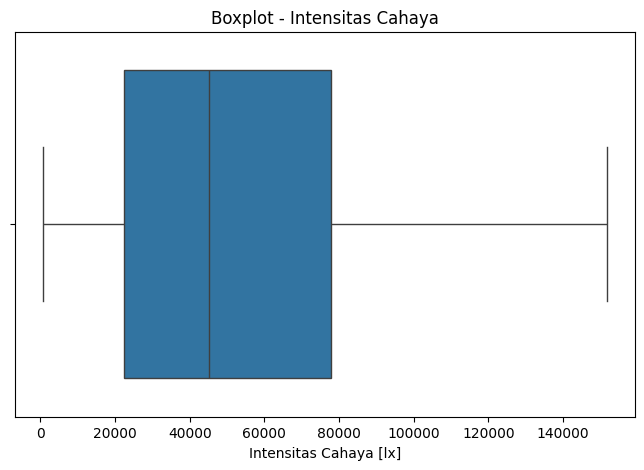

In [ ]:
plt.figure(figsize=(8,5))
sns.boxplot(data=df75, x='Lux')
plt.xlabel('Intensitas Cahaya [lx]')
plt.title(f'Boxplot - Intensitas Cahaya');

Boxplot ini mengkonfirmasi bahwa missing value telah ditangani, dan distribusi data 'Lux' secara keseluruhan tetap mempertahankan karakteristik awalnya.

### 4.2 Time Plot
* Membuat plot deret waktu dari kolom 'Lux'. Ini membantu memvisualisasikan pola data seiring waktu dan mengidentifikasi tren atau musiman.
* Melakukan dekomposisi deret waktu pada kolom 'Lux' untuk memisahkan komponen tren, musiman, dan residual. Plot dari masing-masing komponen ini memberikan wawasan lebih lanjut tentang struktur data deret waktu

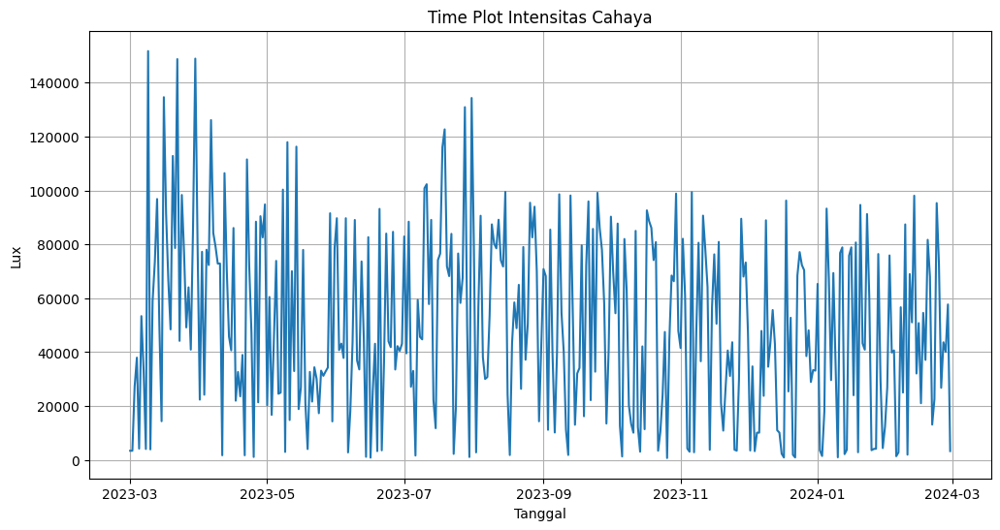

In [ ]:
# Assuming 'df75' is your DataFrame with 'Lux' and a datetime index
plt.figure(figsize=(12, 6))
plt.plot(df75.index, df75['Lux'])
plt.xlabel('Tanggal')
plt.ylabel('Lux')
plt.title('Time Plot Intensitas Cahaya')
plt.grid(True)
plt.show()

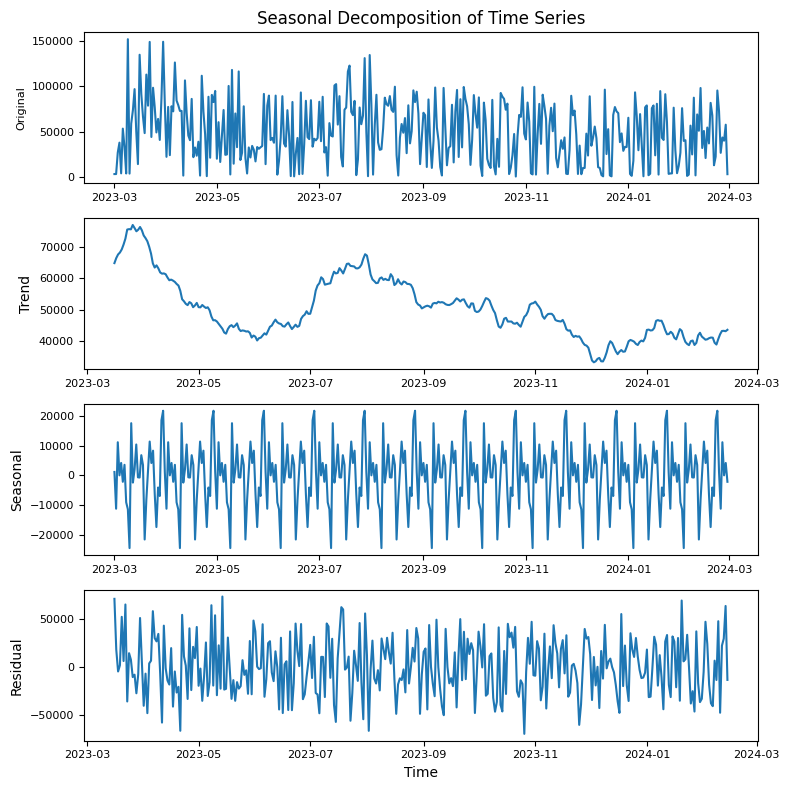

In [ ]:
# Decompose the time series
result = seasonal_decompose(df75['Lux'], model='additive', period=30)  # Adjust 'period' based on your data's seasonality

# Plot the decomposed components
# Create a figure with subplots
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(8, 8))  # Adjust the figure size as per your preference

# Plot the original time series
ax1.plot(result.observed)
ax1.set_ylabel('Original', fontsize=8)  # Adjust y-axis label font size
ax1.set_title('Seasonal Decomposition of Time Series', fontsize=12)  # Adjust title font size

# Plot the trend component
ax2.plot(result.trend)
ax2.set_ylabel('Trend', fontsize=10)  # Adjust y-axis label font size

# Plot the seasonal component
ax3.plot(result.seasonal)
ax3.set_ylabel('Seasonal', fontsize=10)  # Adjust y-axis label font size

# Plot the residual component
ax4.plot(result.resid)
ax4.set_xlabel('Time', fontsize=10)  # Adjust x-axis label font size
ax4.set_ylabel('Residual', fontsize=10)  # Adjust y-axis label font size

# Adjust tick label font size for all subplots
for ax in [ax1, ax2, ax3, ax4]:
    ax.tick_params(axis='both', labelsize=8)

plt.tight_layout()  # Ensure all elements fit within the figure
plt.show()

Dekomposisi deret waktu dengan periode 30 hari  berhasil memisahkan data menjadi komponen utamanya. Plot 'Trend' menunjukkan adanya pola musiman tahunan, sementara plot 'Seasonal' menangkap pola fluktuasi intra-bulan yang konsisten. Keberadaan pola temporal berlapis ini memvalidasi penggunaan model LSTM.

### 4.3 Seleksi Fitur dan Konversi Lux ke Iradiasi
*   Mendefinisikan fungsi `lux_to_solar_irradiation` untuk mengkonversi nilai Lux menjadi Iradiasi Matahari (W/m²).
*   Menerapkan fungsi ini ke kolom 'Lux' untuk membuat kolom baru 'SolarIrradiation'.
*   Menghapus kolom-kolom asli yang tidak akan digunakan sebagai input model ('No', 'Bulan', 'Sudut', 'Tampak', 'Cuaca', dan 'Lux' setelah konversi).

In [ ]:
def lux_to_solar_irradiation(lux_value):
  """Converts Lux value to Solar Irradiation (W/m²)."""
  return round(lux_value / 122, 2)

In [ ]:
df75['SolarIrradiation'] = df75['Lux'].apply(lux_to_solar_irradiation)

In [ ]:
df75 = df75.drop(['No', 'Bulan', 'Sudut', 'Tampak', 'Cuaca'], axis=1)
df75

,Lux,SolarIrradiation
Tanggal,,
2023-03-01,3409.0,27.94
2023-03-02,3412.0,27.97
2023-03-03,27230.0,223.20
2023-03-04,13785.0,112.99
2023-03-05,4193.0,34.37
...,...,...
2024-02-25,26761.0,219.35
2024-02-26,43650.0,357.79
2024-02-27,40102.0,328.70


Model dirancang sebagai univariat, sehingga hanya fitur 'Lux' yang dipertahankan. Kolom lain seperti 'Sudut', 'Bulan', dan 'Cuaca' dihapus. Variabel 'Lux' kemudian dikonversi menjadi 'SolarIrradiation' (W/m²) dengan membaginya dengan konstanta 122.

In [ ]:
output_csv_path = '/content/drive/MyDrive/Tugas_Akhir/DataSiang_before_normalization.csv'
df75.to_csv(output_csv_path)

print(f"Dataset sebelum normalisasi disimpan ke: {output_csv_path}")

Dataset sebelum normalisasi disimpan ke: /content/drive/MyDrive/Tugas_Akhir/DataSiang_before_normalization.csv


### 4.4 Normalisasi Data
*   Menginisialisasi `MinMaxScaler` untuk menskalakan data ke dalam rentang tertentu (biasanya 0-1). Normalisasi penting untuk model neural network seperti LSTM.
*   Menerapkan scaler pada kolom 'SolarIrradiation'.

In [ ]:
# Initialize the StandardScaler
scaler = MinMaxScaler()

df75['SolarIrradiation'] = scaler.fit_transform(df75[['SolarIrradiation']])

In [ ]:
df75

,Lux,SolarIrradiation
Tanggal,,
2023-03-01,3409.0,0.017897
2023-03-02,3412.0,0.017921
2023-03-03,27230.0,0.175664
2023-03-04,13785.0,0.086616
2023-03-05,4193.0,0.023092
...,...,...
2024-02-25,26761.0,0.172553
2024-02-26,43650.0,0.284410
2024-02-27,40102.0,0.260906


Data 'SolarIrradiation' dinormalisasi menggunakan MinMaxScaler untuk mengubah skalanya ke rentang seragam [0, 1] . Langkah ini krusial untuk menstabilkan dan mempercepat proses pelatihan model neural network.Output ini menampilkan sebagian dari kolom 'SolarIrradiation' setelah dinormalisasi menggunakan `MinMaxScaler`. Misalnya, nilai 3409.0 Lux yang sebelumnya dikonversi menjadi 27.94 W/m² sekarang menjadi 0.017897 setelah normalisasi.

### 4.5 Segmentasi dan Pembagian Dataset

*   **Pembagian Data:** Membagi data menjadi set pelatihan (70%), validasi (15%), dan pengujian (15%). Data dibagi secara berurutan sesuai waktu karena ini adalah data deret waktu.


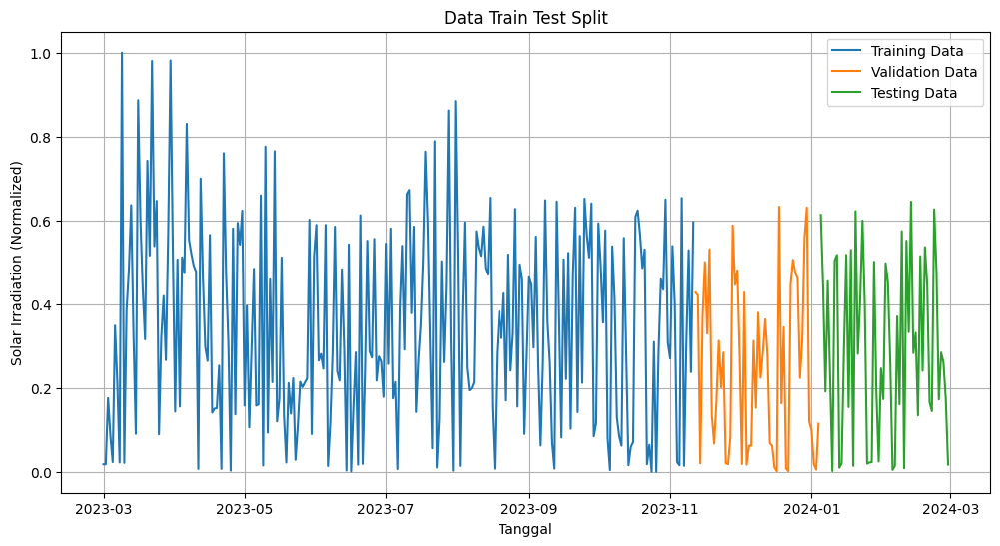

In [ ]:
train_size = int(len(df75) * 0.70)
valid_size = int(len(df75) * 0.15)

# Visualisasi pembagian data
train_set = df75[:train_size]
valid_set = df75[train_size : train_size + valid_size]
test_set = df75[train_size + valid_size:]

plt.figure(figsize=(12, 6))
plt.plot(train_set.index, train_set['SolarIrradiation'], label='Training Data')
plt.plot(valid_set.index, valid_set['SolarIrradiation'], label='Validation Data')
plt.plot(test_set.index, test_set['SolarIrradiation'], label='Testing Data')
plt.xlabel('Tanggal')
plt.ylabel('Solar Irradiation (Normalized)')
plt.title('Data Train Test Split')
plt.legend()
plt.grid(True)
plt.show()

Dataset dibagi secara kronologis dengan rasio 70/15/15, menghasilkan 256 data latih, 54 data validasi, dan 56 data uji.
*   **Garis Biru (Training Data)**: Menunjukkan data yang digunakan untuk melatih model.
*   **Garis Oranye (Validation Data)**: Menunjukkan data yang digunakan untuk mengevaluasi model selama pelatihan (untuk memantau performa dan mencegah overfitting).
*   **Garis Hijau (Testing Data)**: Menunjukkan data yang digunakan untuk evaluasi akhir model setelah pelatihan selesai.

*   **Segmentasi Data (`create_windowed_dataset`):**
    *   Fungsi `create_windowed_dataset` membuat urutan (window) data input dan target output untuk model LSTM.
    *   Dengan `Window_Size = 7`, model akan menggunakan data 7 hari sebelumnya untuk memprediksi nilai pada hari berikutnya.
    *   Data latih, validasi, dan uji diubah menjadi format 3D (sampel, timestep/window\_size, fitur) yang diperlukan oleh layer LSTM.

In [ ]:
def create_windowed_dataset(data, window_size):
    """
    Creates input (X) and output (y) datasets for time series forecasting
    using a sliding window approach.

    Args:
        data (pd.Series or np.ndarray): The time series data.
        window_size (int): The number of time steps in the input window
                           used for prediction.

    Returns:
        tuple: A tuple containing two numpy arrays:
               - X (np.ndarray): The input sequences (samples, window_size).
               - y (np.ndarray): The corresponding target values (samples,).
    """
    X, y = [], []
    # Iterate through the data to create windows
    for i in range(len(data) - window_size):
        # Input is the data from index i up to i + window_size
        X.append(data[i : i + window_size])
        # Output is the data value at the index after the window
        # Use iloc for positional indexing to avoid FutureWarning
        y.append(data.iloc[i + window_size] if isinstance(data, pd.Series) else data[i + window_size])
    # Convert lists to numpy arrays
    return np.array(X), np.array(y)

In [ ]:
data = df75[['SolarIrradiation']].values

train_data = data[:train_size]
valid_data = data[train_size : train_size + valid_size]
test_data = data[train_size + valid_size:]

Window_Size = 7
x_train, y_train = create_windowed_dataset(train_data, Window_Size)
x_valid, y_valid = create_windowed_dataset(valid_data, Window_Size)
x_test, y_test = create_windowed_dataset(test_data, Window_Size)

In [ ]:
print("--- Hasil Setelah Windowing (7 hari) ---")
print(f"Bentuk X_train (input latih): {x_train.shape}")
print(f"Bentuk y_train (output latih): {y_train.shape}\n")

print(f"Bentuk X_valid (input validasi): {x_valid.shape}")
print(f"Bentuk y_valid (output validasi): {y_valid.shape}\n")

print(f"Bentuk X_test (input uji): {x_test.shape}")
print(f"Bentuk y_test (output uji): {y_test.shape}\n")

--- Hasil Setelah Windowing (7 hari) ---
Bentuk X_train (input latih): (249, 7, 1)
Bentuk y_train (output latih): (249, 1)

Bentuk X_valid (input validasi): (47, 7, 1)
Bentuk y_valid (output validasi): (47, 1)

Bentuk X_test (input uji): (49, 7, 1)
Bentuk y_test (output uji): (49, 1)



Data disegmentasi menggunakan sliding window berukuran 7 hari untuk memprediksi hari ke-8. Proses ini menghasilkan 249 sampel latih, 47 sampel validasi, dan 49 sampel uji yang siap digunakan untuk melatih model LSTM .

In [ ]:
# --- 5. Contoh Hasil Windowing ---
print("--- Contoh 3 Sampel Pertama dari Data Latih ---")
for i in range(3):
    print(f"Input (X): {x_train[i]}  ->  Output (y): {y_train[i]}")

--- Contoh 3 Sampel Pertama dari Data Latih ---
Input (X): [[0.01789682]
 [0.01792106]
 [0.17566356]
 [0.24667717]
 [0.02309215]
 [0.34878197]
 [0.21453561]]  ->  Output (y): [0.02222761]
Input (X): [[0.01792106]
 [0.17566356]
 [0.24667717]
 [0.02309215]
 [0.34878197]
 [0.21453561]
 [0.02222761]]  ->  Output (y): [1.]
Input (X): [[0.17566356]
 [0.24667717]
 [0.02309215]
 [0.34878197]
 [0.21453561]
 [0.02222761]
 [1.        ]]  ->  Output (y): [0.02126611]


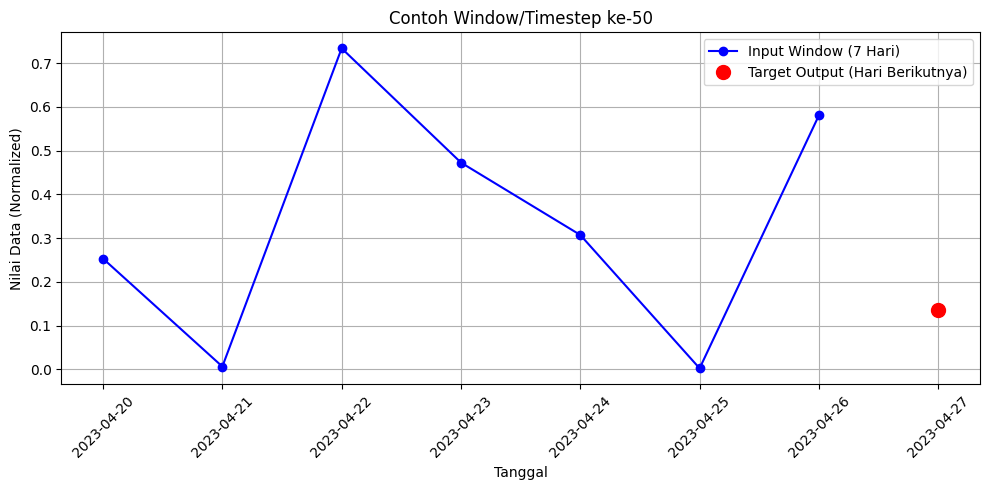

In [ ]:
# Pilih satu sampel untuk divisualisasikan (misal, sampel ke-50)
sample_idx = 50
input_window = x_train[sample_idx]
target_output = y_train[sample_idx]

# Define WINDOW_SIZE and train_dates
WINDOW_SIZE = 7 # Assuming WINDOW_SIZE is 7 based on previous cells
train_dates = train_set.index

# Dapatkan tanggal yang sesuai untuk sampel ini
window_dates = train_dates[sample_idx : sample_idx + WINDOW_SIZE]
target_date = train_dates[sample_idx + WINDOW_SIZE]

plt.figure(figsize=(10, 5))
# Plot 7 hari data input
plt.plot(window_dates, input_window, 'bo-', label=f'Input Window ({WINDOW_SIZE} Hari)')
# Plot 1 hari data target
plt.plot(target_date, target_output, 'ro', markersize=10, label='Target Output (Hari Berikutnya)')

plt.title(f'Contoh Window/Timestep ke-{sample_idx}')
plt.xlabel('Tanggal')
plt.ylabel('Nilai Data (Normalized)')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout() # Merapikan layout
plt.show()

Plot ini menggambarkan bagaimana model LSTM menerima urutan data historis (input window) untuk memprediksi nilai tunggal di masa depan (target output), sesuai dengan segmentasi data yang telah dilakukan.

## 5. Pelatihan dan Evaluasi Kinerja Model

Pada tahap inti penelitian ini, model LSTM dilatih dan dievaluasi menggunakan tiga jenis optimizer yang berbeda: SGD, RMSProp, dan Adam. Untuk setiap optimizer, dilakukan empat percobaan dengan konfigurasi hyperparameter yang bervariasi (seperti learning rate, momentum, dll.) untuk membandingkan dampaknya terhadap proses pembelajaran. Kinerja setiap model selama pelatihan dimonitor melalui kurva loss dan MAE.

In [ ]:
def train_model(x_train, y_train, x_valid, y_valid, optimizer, name):
    """
    Trains a pre-defined Keras model.

    Args:
        model (tf.keras.Model): The Keras model to train.
        x_train (np.ndarray): Training input data.
        y_train (np.ndarray): Training target data.
        x_valid (np.ndarray): Validation input data.
        y_valid (np.ndarray): Validation target data.
        optimizer (tf.keras.optimizers.Optimizer): The optimizer to use for training.
        name (str): A name for the model (used for saving checkpoints and logs).

    Returns:
        tuple: A tuple containing:
               - model (tf.keras.Model): The trained model.
               - history (tf.keras.callbacks.History): The training history object.
    """
    # Correct input shape for LSTM (timesteps, features)
    input_shape = (x_train.shape[1], 1)
    model = create_lstm_model(input_shape)

    # Compile the model with the specified optimizer and metrics
    model.compile(loss='mse',
                    optimizer=optimizer,
                    metrics=["mae"])

    # Define callbacks for saving the best model and logging to TensorBoard
    model_checkpoint = ModelCheckpoint(
        filepath=f'/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_{name}.keras',
        monitor='val_mae', # Monitor validation MAE
        save_best_only=True, # Save only the model with the best validation MAE
        mode='min' # 'min' mode means we want to minimize the monitored metric
    )

    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=f'/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/logs_{name}', histogram_freq=1)

    # Train the model
    history = model.fit(
        # Reshape x_train and x_valid to be 3D for LSTM input
        x_train,
        y_train,
        epochs=150, # Number of training epochs
        verbose=2, # Suppress verbose output during training
        batch_size=1, # Batch size for training
        validation_data=(x_valid, y_valid), # Data for validation
        callbacks=[model_checkpoint, tensorboard_callback] # List of callbacks to apply
    )

    # Save the final model after training is complete
    model.save(f'/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/final_{name}.keras')

    return model, history

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred):
    """
    Calculates Mean Absolute Percentage Error (MAPE).

    Args:
        y_true (np.ndarray): Actual values.
        y_pred (np.ndarray): Predicted values.

    Returns:
        float: The calculated MAPE. Returns NaN if the mean of actual values is zero.
    """
    # Ensure y_true and y_pred are numpy arrays for consistent operations
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Avoid division by zero or very small numbers in the denominator
    # Use a small epsilon or check if mean is close to zero
    mean_actual = np.mean(np.abs(y_true))
    if mean_actual < np.finfo(float).eps: # Check if mean is close to machine epsilon
        return np.nan # Return NaN if mean actual is effectively zero

    # Calculate MAE and then MAPE
    mae = np.mean(np.abs(y_true - y_pred))
    return (mae / mean_actual) * 100


def predict_and_plot(model_paths, x_data, y_data, scaler, title="Predictions vs. Actual Solar Irradiation"):
    """
    Loads models, makes predictions, calculates evaluation metrics (MAE, RMSE, MAPE),
    and plots the predictions against actual values, and visualizes the metrics.

    Args:
        model_paths (dict): A dictionary where keys are model names (str) and
                            values are paths to saved Keras models (str).
        x_data (np.ndarray): Input data for making predictions.
        y_data (np.ndarray): Actual target values corresponding to x_data.
        scaler (sklearn.preprocessing.MinMaxScaler): The scaler fitted on the
                                                     training data, used for
                                                     inverse transformation.
        title (str, optional): The title for the time series prediction plot.
                               Defaults to "Predictions vs. Actual Solar Irradiation".

    Returns:
        None: The function displays plots but does not return any value.
    """
    predictions = {}
    mae_scores = {}
    rmse_scores = {}
    mape_scores = {}

    # Load models and make predictions
    for name, path in model_paths.items():
        try:
            # Use custom_objects if any custom layers or functions are used in the model
            # For standard LSTM layers, this is usually not needed, but good practice
            model = tf.keras.models.load_model(path)
            # Ensure x_data is in the correct 3D shape (samples, timesteps, features)
            # x_data from create_windowed_dataset should already be (samples, window_size)
            # Need to reshape to (samples, window_size, 1) for LSTM input
            x_data_reshaped = np.reshape(x_data, (x_data.shape[0], x_data.shape[1], 1))
            y_pred = model.predict(x_data_reshaped)
            # Inverse transform predictions. Ensure y_pred is 2D for scaler.inverse_transform
            predictions[name] = scaler.inverse_transform(y_pred).flatten()
            print(f"Successfully loaded and predicted with model: {name}")
        except Exception as e:
            print(f"Error loading or predicting with model {name} from {path}: {e}")
            predictions[name] = np.full(y_data.shape, np.nan) # Fill with NaN if prediction fails


    # Inverse transform actual y_data. Need to reshape y_data to be 2D for inverse_transform
    # y_data from create_windowed_dataset should be (samples,) or (samples, 1)
    # Reshape to (samples, 1) if it's (samples,)
    y_data_reshaped = y_data.reshape(-1, 1) if y_data.ndim == 1 else y_data
    y_actual_original = scaler.inverse_transform(y_data_reshaped).flatten()


    # Calculate metrics for successful predictions
    valid_models = {name: preds for name, preds in predictions.items() if not np.isnan(preds).all()}

    if not valid_models:
        print("No models could make valid predictions. Cannot calculate metrics or plot.")
        return # Exit the function if no valid predictions

    for name, preds in valid_models.items():
        # Ensure prediction and actual arrays have the same length for metrics calculation
        min_len = min(len(y_actual_original), len(preds))
        y_true_subset = y_actual_original[:min_len]
        y_pred_subset = preds[:min_len]

        mae_scores[name] = mean_absolute_error(y_true_subset, y_pred_subset)
        rmse_scores[name] = np.sqrt(mean_squared_error(y_true_subset, y_pred_subset))
        mape_scores[name] = mean_absolute_percentage_error(y_true_subset, y_pred_subset)


    # Plot the time series predictions
    plt.figure(figsize=(15, 6))
    # Use original index if y_data was a Series, otherwise use simple range
    if hasattr(y_data, 'index'):
         plot_index = y_data.index[:len(y_actual_original)]
         # Adjust prediction_dates to match the actual values' index length
         prediction_dates = plot_index[-len(next(iter(valid_models.values()))):] if valid_models else []

    else:
         plot_index = np.arange(len(y_actual_original))
         prediction_dates = np.arange(len(y_actual_original) - len(next(iter(valid_models.values()))), len(y_actual_original)) if valid_models else []


    plt.plot(plot_index, y_actual_original, label='Actual', linewidth=2)
    for name, preds in valid_models.items():
         # Ensure prediction index matches the actual index subset used for metrics/plotting
        if len(prediction_dates) == len(preds):
            plt.plot(prediction_dates, preds, label=f'{name} Predictions', linestyle='--')
        else:
            print(f"Warning: Length mismatch for {name} predictions ({len(preds)}) and actual values subset ({len(prediction_dates)}). Skipping time series plot for this model.")


    plt.xlabel('Time Steps' if not hasattr(y_data, 'index') else 'Tanggal') # Use 'Tanggal' if datetime index
    plt.ylabel('Solar Irradiation (W/m²)')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot MAE, RMSE, and MAPE
    if valid_models:
        model_names = list(valid_models.keys())
        # Ensure metric values are aligned with model_names list order
        mae_values = [mae_scores[name] for name in model_names]
        rmse_values = [rmse_scores[name] for name in model_names]
        mape_values = [mape_scores[name] for name in model_names]

        x = np.arange(len(model_names))
        width = 0.25 # Adjusted width for potentially more bars

        plt.figure(figsize=(12, 6)) # Adjusted figure size
        bars1 = plt.bar(x - width, mae_values, width, label='MAE')
        bars2 = plt.bar(x, rmse_values, width, label='RMSE')
        bars3 = plt.bar(x + width, mape_values, width, label='MAPE')

        # Add value labels on top of bars
        def add_value_labels(bars):
            for bar in bars:
                height = bar.get_height()
                # Use f-string for formatting, check if height is NaN
                label_text = f'{height:.2f}' if not np.isnan(height) else 'NaN'
                plt.text(bar.get_x() + bar.get_width()/2, height, label_text, ha='center', va='bottom')

        add_value_labels(bars1)
        add_value_labels(bars2)
        add_value_labels(bars3)


        plt.xlabel('Models')
        plt.ylabel('Score')
        plt.title('Model Evaluation Metrics (MAE, RMSE, MAPE)')
        plt.xticks(x, model_names, rotation=45, ha='right') # Rotate labels for better readability
        plt.legend()
        plt.grid(axis='y')
        plt.tight_layout() # Adjust layout to prevent labels overlapping
        plt.show()
    else:
        print("No valid models to plot metrics for.")

In [ ]:
GLOBAL_COLORS = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

def plot_train_history(histories, name):
    """
    Plots the training and validation loss and MAE for multiple model histories.

    Args:
        histories (list): A list of tf.keras.callbacks.History objects,
                          one for each training run to be plotted.
        name (str): A name for the set of histories (e.g., 'SGD', 'RMSProp', 'Adam')
                    used for the overall plot title.
    """
    fig = plt.figure(figsize=(14, 10))
    fig.suptitle(f'Training History - Optimizer {name}', fontsize=16)

    gs = gridspec.GridSpec(2, 2, figure=fig)

    ax0 = plt.subplot(gs[0, 0]) # Training Loss
    ax1 = plt.subplot(gs[0, 1]) # Validation Loss
    ax2 = plt.subplot(gs[1, 0]) # Training MAE
    ax3 = plt.subplot(gs[1, 1]) # Validation MAE

    for i, history in enumerate(histories):
        label = f'Percobaan ke-{i+1}'
        color = GLOBAL_COLORS[i % len(GLOBAL_COLORS)] # Ambil warna dari palet

        # Plot Loss (Training & Validation)
        ax0.plot(history.history['loss'], label=label, color=color)
        ax1.plot(history.history['val_loss'], label=label, color=color)

        # Plot MAE (Training & Validation)
        ax2.plot(history.history['mae'], label=label, color=color)
        ax3.plot(history.history['val_mae'], label=label, color=color)

    # Configure Labels, Titles, and Grids
    ax0.set_title('Training Loss (MSE)')
    ax0.set_xlabel('Epoch')
    ax0.grid(True)

    ax1.set_title('Validation Loss (MSE)')
    ax1.set_xlabel('Epoch')
    ax1.grid(True)

    ax2.set_title('Training MAE')
    ax2.set_xlabel('Epoch')
    ax2.grid(True)

    ax3.set_title('Validation MAE')
    ax3.set_xlabel('Epoch')
    ax3.grid(True)

    handles, labels = ax0.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.96),
               fancybox=True, shadow=True, ncol=len(histories))

    plt.tight_layout(rect=[0, 0.05, 1, 0.97])
    plt.show()


def plot_single_history(history, model_name="Model", index=0):
    """
    Plots the training and validation loss and MAE for a single model history,
    using a consistent color based on its index.

    Args:
        history (tf.keras.callbacks.History): The History object from a single training run.
        model_name (str): A name for the model (e.g., 'SGD Model 1', 'Adam')
                          used for the overall plot title.
        index (int): The index of this history in the global list of histories,
                     used to select a consistent color from GLOBAL_COLORS.
    """
    fig = plt.figure(figsize=(12, 8))
    fig.suptitle(f'Training History - {model_name}', fontsize=16)

    gs = gridspec.GridSpec(2, 2, figure=fig)

    ax0 = plt.subplot(gs[0, 0]) # Training Loss
    ax1 = plt.subplot(gs[0, 1]) # Validation Loss
    ax2 = plt.subplot(gs[1, 0]) # Training MAE
    ax3 = plt.subplot(gs[1, 1]) # Validation MAE

    # Ambil warna berdasarkan indeks
    plot_color = GLOBAL_COLORS[index % len(GLOBAL_COLORS)]

    # Plot Loss (Training & Validation)
    ax0.plot(history.history['loss'], label='Training Loss', color=plot_color)
    ax1.plot(history.history['val_loss'], label='Validation Loss', color=plot_color)

    # Plot MAE (Training & Validation)
    ax2.plot(history.history['mae'], label='Training MAE', color=plot_color)
    ax3.plot(history.history['val_mae'], label='Validation MAE', color=plot_color)

    # Configure Labels, Titles, and Grids for each subplot
    ax0.set_title('Training Loss (MSE)')
    ax0.set_xlabel('Epoch')
    ax0.grid(True)
    ax0.legend()

    ax1.set_title('Validation Loss (MSE)')
    ax1.set_xlabel('Epoch')
    ax1.grid(True)
    ax1.legend()

    ax2.set_title('Training MAE')
    ax2.set_xlabel('Epoch')
    ax2.grid(True)
    ax2.legend()

    ax3.set_title('Validation MAE')
    ax3.set_xlabel('Epoch')
    ax3.grid(True)
    ax3.legend()

    plt.tight_layout(rect=[0, 0.05, 1, 0.97])
    plt.show()

### 5.1 Pelatihan Model dengan Optimizer SGD

In [ ]:
sgd1_model, sgd1 = train_model(x_train, y_train,
                               x_valid, y_valid,
                               tf.keras.optimizers.SGD(
                                  learning_rate=0.01,
                                  momentum=0.0), "sgd_1")

Epoch 1/150
249/249 - 10s - 38ms/step - loss: 0.0581 - mae: 0.2038 - val_loss: 0.0648 - val_mae: 0.2196
Epoch 2/150
249/249 - 3s - 13ms/step - loss: 0.0549 - mae: 0.1996 - val_loss: 0.0470 - val_mae: 0.1874
Epoch 3/150
249/249 - 3s - 13ms/step - loss: 0.0547 - mae: 0.1980 - val_loss: 0.0392 - val_mae: 0.1720
Epoch 4/150
249/249 - 3s - 12ms/step - loss: 0.0556 - mae: 0.2011 - val_loss: 0.0460 - val_mae: 0.1856
Epoch 5/150
249/249 - 6s - 23ms/step - loss: 0.0552 - mae: 0.2022 - val_loss: 0.0525 - val_mae: 0.1973
Epoch 6/150
249/249 - 5s - 18ms/step - loss: 0.0541 - mae: 0.1968 - val_loss: 0.0451 - val_mae: 0.1838
Epoch 7/150
249/249 - 6s - 25ms/step - loss: 0.0550 - mae: 0.2005 - val_loss: 0.0386 - val_mae: 0.1705
Epoch 8/150
249/249 - 5s - 20ms/step - loss: 0.0554 - mae: 0.2012 - val_loss: 0.0507 - val_mae: 0.1941
Epoch 9/150
249/249 - 5s - 21ms/step - loss: 0.0552 - mae: 0.1993 - val_loss: 0.0619 - val_mae: 0.2147
Epoch 10/150
249/249 - 6s - 23ms/step - loss: 0.0555 - mae: 0.2013 - val

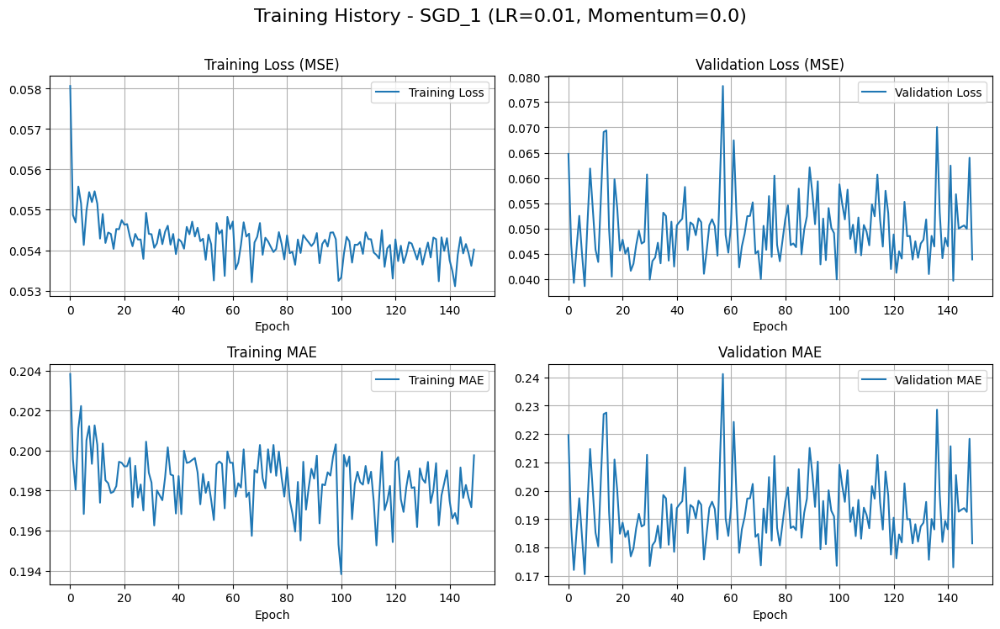

In [ ]:
plot_single_history(sgd1, model_name="SGD_1 (LR=0.01, Momentum=0.0)", index=0)

In [ ]:
sgd2_model, sgd2 = train_model(x_train, y_train,
                               x_valid, y_valid,
                               tf.keras.optimizers.SGD(
                                  learning_rate=0.01,
                                  momentum=0.9), "sgd_2")

Epoch 1/150
249/249 - 10s - 39ms/step - loss: 0.0625 - mae: 0.2102 - val_loss: 0.0389 - val_mae: 0.1713
Epoch 2/150
249/249 - 3s - 13ms/step - loss: 0.0595 - mae: 0.2017 - val_loss: 0.0372 - val_mae: 0.1676
Epoch 3/150
249/249 - 3s - 12ms/step - loss: 0.0581 - mae: 0.2032 - val_loss: 0.0626 - val_mae: 0.2159
Epoch 4/150
249/249 - 3s - 12ms/step - loss: 0.0591 - mae: 0.2017 - val_loss: 0.0699 - val_mae: 0.2282
Epoch 5/150
249/249 - 5s - 19ms/step - loss: 0.0557 - mae: 0.1972 - val_loss: 0.0396 - val_mae: 0.1730
Epoch 6/150
249/249 - 3s - 14ms/step - loss: 0.0601 - mae: 0.2074 - val_loss: 0.0455 - val_mae: 0.1846
Epoch 7/150
249/249 - 3s - 13ms/step - loss: 0.0587 - mae: 0.1991 - val_loss: 0.0503 - val_mae: 0.1933
Epoch 8/150
249/249 - 3s - 13ms/step - loss: 0.0582 - mae: 0.2030 - val_loss: 0.0560 - val_mae: 0.2040
Epoch 9/150
249/249 - 5s - 19ms/step - loss: 0.0577 - mae: 0.2019 - val_loss: 0.0625 - val_mae: 0.2159
Epoch 10/150
249/249 - 3s - 13ms/step - loss: 0.0591 - mae: 0.2036 - val

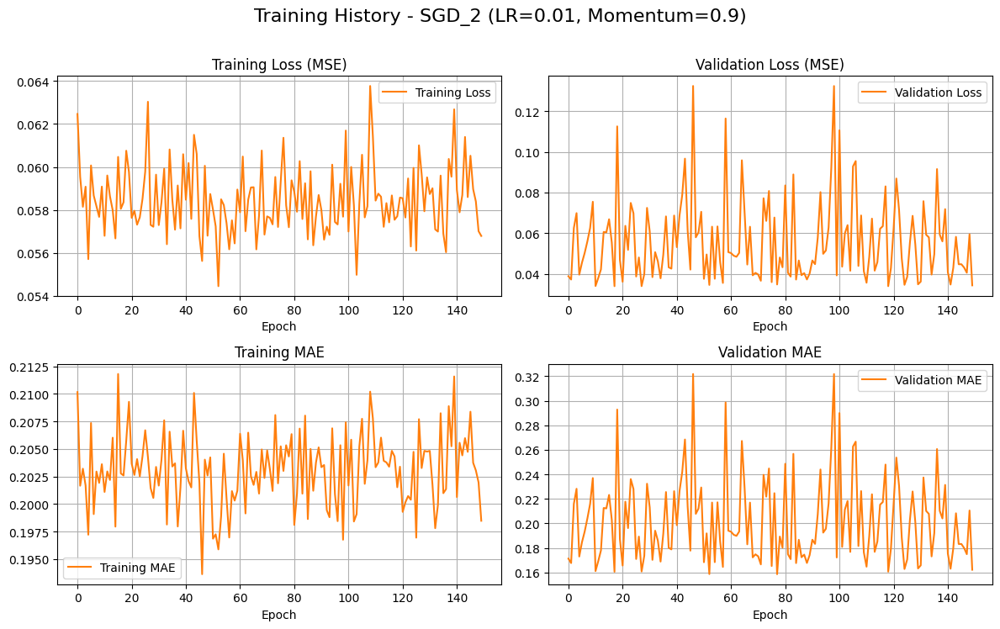

In [ ]:
plot_single_history(sgd2, model_name="SGD_2 (LR=0.01, Momentum=0.9)", index=1)

In [ ]:
sgd3_model, sgd3 = train_model(x_train, y_train,
                               x_valid, y_valid,
                               tf.keras.optimizers.SGD(
                                  learning_rate=0.001,
                                  momentum=0.0), "sgd_3")

Epoch 1/150
249/249 - 8s - 33ms/step - loss: 0.0827 - mae: 0.2287 - val_loss: 0.0407 - val_mae: 0.1751
Epoch 2/150
249/249 - 4s - 18ms/step - loss: 0.0542 - mae: 0.1974 - val_loss: 0.0480 - val_mae: 0.1891
Epoch 3/150
249/249 - 3s - 12ms/step - loss: 0.0534 - mae: 0.1970 - val_loss: 0.0510 - val_mae: 0.1945
Epoch 4/150
249/249 - 3s - 13ms/step - loss: 0.0533 - mae: 0.1973 - val_loss: 0.0476 - val_mae: 0.1885
Epoch 5/150
249/249 - 3s - 13ms/step - loss: 0.0534 - mae: 0.1975 - val_loss: 0.0474 - val_mae: 0.1881
Epoch 6/150
249/249 - 4s - 17ms/step - loss: 0.0529 - mae: 0.1951 - val_loss: 0.0552 - val_mae: 0.2025
Epoch 7/150
249/249 - 3s - 12ms/step - loss: 0.0535 - mae: 0.1979 - val_loss: 0.0520 - val_mae: 0.1964
Epoch 8/150
249/249 - 5s - 21ms/step - loss: 0.0535 - mae: 0.1980 - val_loss: 0.0497 - val_mae: 0.1922
Epoch 9/150
249/249 - 6s - 25ms/step - loss: 0.0534 - mae: 0.1969 - val_loss: 0.0519 - val_mae: 0.1962
Epoch 10/150
249/249 - 4s - 16ms/step - loss: 0.0534 - mae: 0.1978 - val_

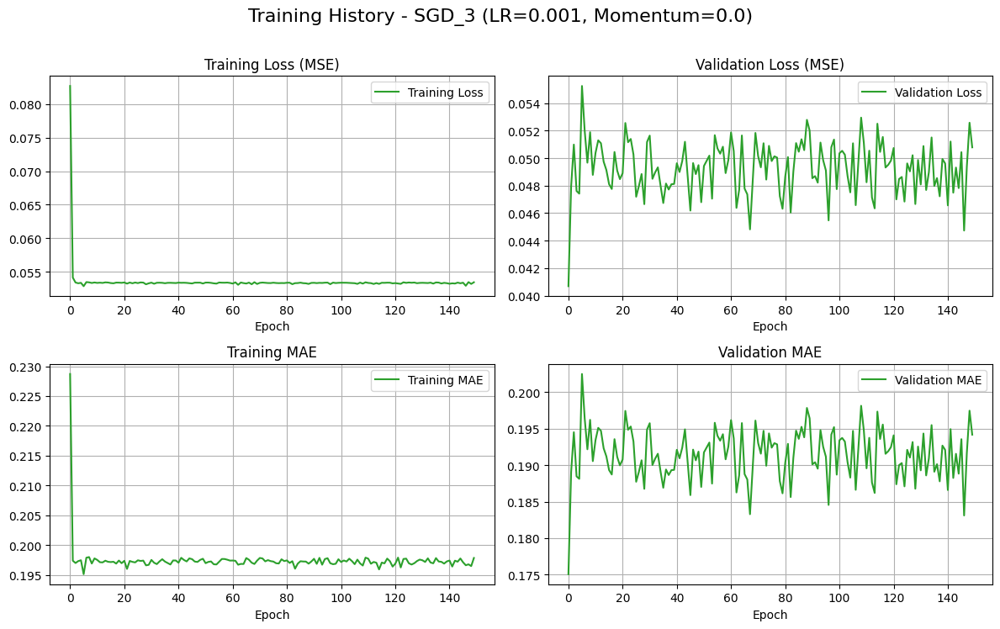

In [ ]:
plot_single_history(sgd3, model_name="SGD_3 (LR=0.001, Momentum=0.0)", index=2)

In [ ]:
sgd4_model, sgd4 = train_model(x_train, y_train,
                               x_valid, y_valid,
                               tf.keras.optimizers.SGD(
                                  learning_rate=0.001,
                                  momentum=0.9), "sgd_4")

Epoch 1/150
249/249 - 9s - 36ms/step - loss: 0.0606 - mae: 0.2098 - val_loss: 0.0656 - val_mae: 0.2213
Epoch 2/150
249/249 - 4s - 16ms/step - loss: 0.0542 - mae: 0.1993 - val_loss: 0.0573 - val_mae: 0.2065
Epoch 3/150
249/249 - 5s - 19ms/step - loss: 0.0565 - mae: 0.2030 - val_loss: 0.0532 - val_mae: 0.1986
Epoch 4/150
249/249 - 5s - 20ms/step - loss: 0.0559 - mae: 0.2007 - val_loss: 0.0688 - val_mae: 0.2267
Epoch 5/150
249/249 - 4s - 16ms/step - loss: 0.0547 - mae: 0.1973 - val_loss: 0.0630 - val_mae: 0.2167
Epoch 6/150
249/249 - 4s - 15ms/step - loss: 0.0558 - mae: 0.1999 - val_loss: 0.0410 - val_mae: 0.1758
Epoch 7/150
249/249 - 4s - 18ms/step - loss: 0.0552 - mae: 0.1983 - val_loss: 0.0670 - val_mae: 0.2237
Epoch 8/150
249/249 - 6s - 23ms/step - loss: 0.0555 - mae: 0.2012 - val_loss: 0.0468 - val_mae: 0.1870
Epoch 9/150
249/249 - 4s - 17ms/step - loss: 0.0555 - mae: 0.1999 - val_loss: 0.0536 - val_mae: 0.1994
Epoch 10/150
249/249 - 5s - 21ms/step - loss: 0.0564 - mae: 0.2019 - val_

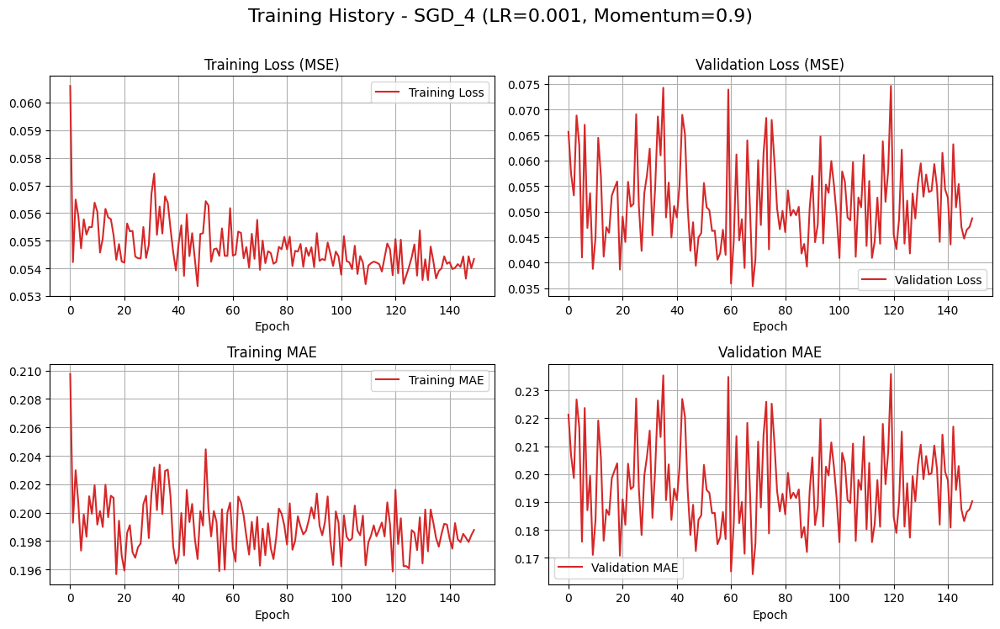

In [ ]:
plot_single_history(sgd4, model_name="SGD_4 (LR=0.001, Momentum=0.9)", index=3)

In [ ]:
sgd1_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                   │ (None, 7, 128)         │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 7, 64)          │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 129,987 (507.77 KB)

 Trainable params: 129,985 (507.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

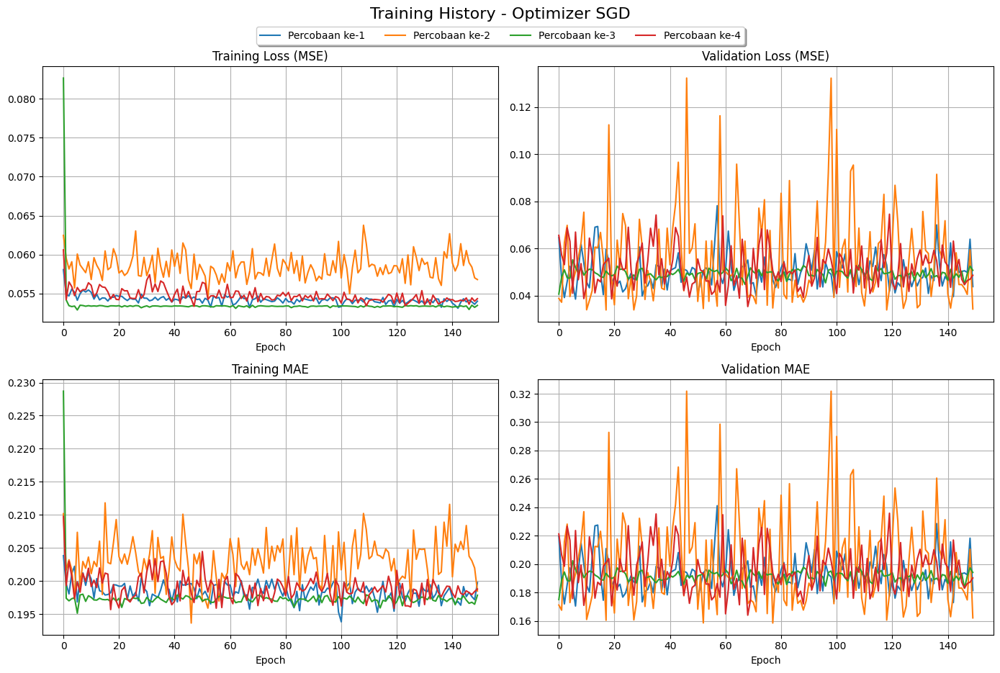

In [ ]:
histories = [sgd1, sgd2, sgd3, sgd4]
plot_train_history(histories, 'SGD')

Analisis kurva pelatihan menunjukkan konfigurasi dengan learning rate rendah (Percobaan 3 & 4) lebih stabil. Konfigurasi lr=0.01 dengan momentum=0.9 (Percobaan 2) sangat tidak stabil, mengindikasikan kesulitan konvergensi.

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step
Successfully loaded and predicted with model: Percobaan 1
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step
Successfully loaded and predicted with model: Percobaan 2


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step
Successfully loaded and predicted with model: Percobaan 3


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step
Successfully loaded and predicted with model: Percobaan 4


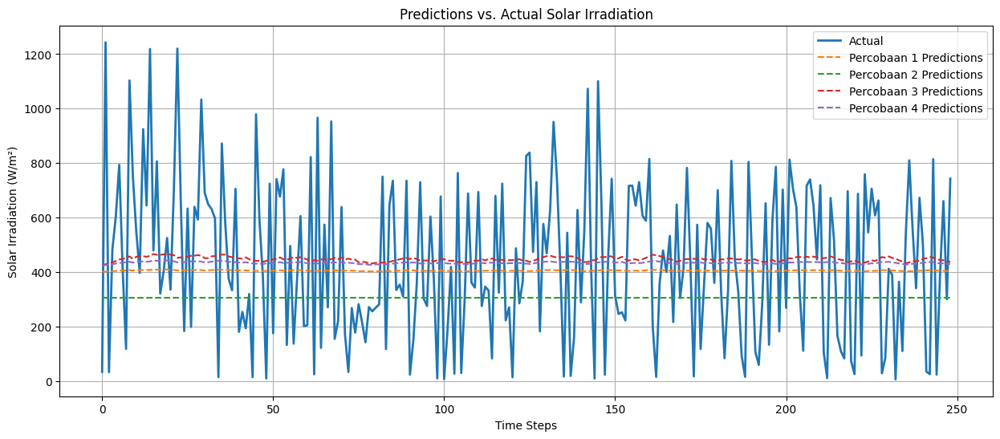

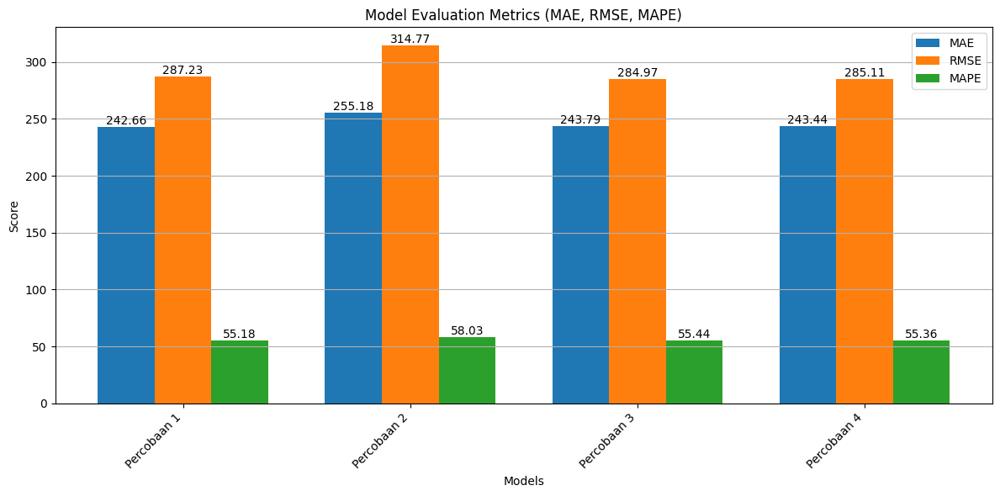

In [ ]:
# Contoh pemanggilan fungsi:
model_paths = {
    "Percobaan 1": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_sgd_1.keras",
    "Percobaan 2": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_sgd_2.keras",
    "Percobaan 3": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_sgd_3.keras",
    "Percobaan 4": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_sgd_4.keras"
}

predict_and_plot(model_paths, x_train, y_train, scaler)

Pada data latih, Percobaan 1 (lr=0.01, mom=0.0) menunjukkan MAE dan RMSE terendah, sementara Percobaan 3 (lr=0.001, mom=0.02) unggul pada metrik MAPE. Percobaan 2 berkinerja paling buruk di semua metrik.

### 5.2 Pelatihan Model dengan Optimizer RMSProp

In [ ]:
rms1_model, rms1 = train_model(x_train, y_train,
                               x_valid, y_valid,
                               tf.keras.optimizers.RMSprop(
                                  learning_rate=0.01,
                                  rho=0.9), "rms_1")

Epoch 1/150
249/249 - 10s - 40ms/step - loss: 0.0675 - mae: 0.2130 - val_loss: 0.0903 - val_mae: 0.2589
Epoch 2/150
249/249 - 3s - 13ms/step - loss: 0.0591 - mae: 0.2007 - val_loss: 0.0768 - val_mae: 0.2389
Epoch 3/150
249/249 - 3s - 13ms/step - loss: 0.0558 - mae: 0.2002 - val_loss: 0.0389 - val_mae: 0.1712
Epoch 4/150
249/249 - 7s - 27ms/step - loss: 0.0559 - mae: 0.2017 - val_loss: 0.0377 - val_mae: 0.1685
Epoch 5/150
249/249 - 4s - 15ms/step - loss: 0.0551 - mae: 0.1974 - val_loss: 0.0372 - val_mae: 0.1675
Epoch 6/150
249/249 - 3s - 13ms/step - loss: 0.0560 - mae: 0.2019 - val_loss: 0.0383 - val_mae: 0.1698
Epoch 7/150
249/249 - 6s - 25ms/step - loss: 0.0553 - mae: 0.1988 - val_loss: 0.0528 - val_mae: 0.1979
Epoch 8/150
249/249 - 4s - 16ms/step - loss: 0.0552 - mae: 0.2019 - val_loss: 0.0643 - val_mae: 0.2188
Epoch 9/150
249/249 - 5s - 20ms/step - loss: 0.0548 - mae: 0.1986 - val_loss: 0.0451 - val_mae: 0.1838
Epoch 10/150
249/249 - 7s - 27ms/step - loss: 0.0555 - mae: 0.2003 - val

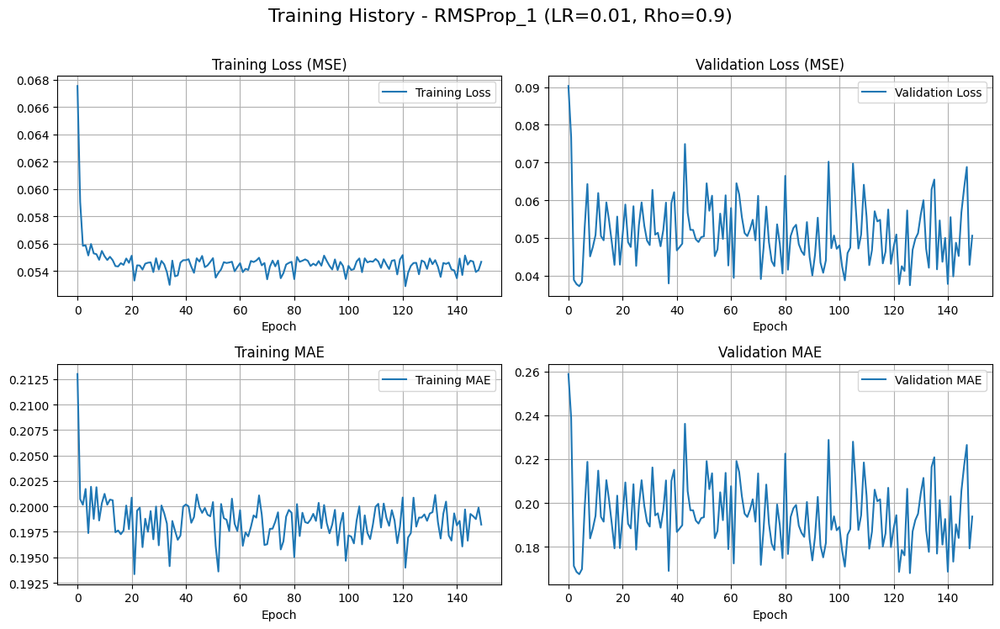

In [ ]:
plot_single_history(rms1, model_name="RMSProp_1 (LR=0.01, Rho=0.9)", index=0)

In [ ]:
rms2_model, rms2 = train_model(x_train, y_train,
                               x_valid, y_valid,
                               tf.keras.optimizers.RMSprop(
                                  learning_rate=0.01,
                                  rho=0.5), "rms_2")

Epoch 1/150
249/249 - 10s - 38ms/step - loss: 0.0792 - mae: 0.2226 - val_loss: 0.0425 - val_mae: 0.1785
Epoch 2/150
249/249 - 4s - 14ms/step - loss: 0.0580 - mae: 0.2064 - val_loss: 0.0746 - val_mae: 0.2356
Epoch 3/150
249/249 - 5s - 19ms/step - loss: 0.0596 - mae: 0.2047 - val_loss: 0.0351 - val_mae: 0.1636
Epoch 4/150
249/249 - 4s - 15ms/step - loss: 0.0597 - mae: 0.2023 - val_loss: 0.0940 - val_mae: 0.2644
Epoch 5/150
249/249 - 5s - 20ms/step - loss: 0.0592 - mae: 0.2051 - val_loss: 0.0404 - val_mae: 0.1745
Epoch 6/150
249/249 - 6s - 23ms/step - loss: 0.0563 - mae: 0.1938 - val_loss: 0.0444 - val_mae: 0.1826
Epoch 7/150
249/249 - 3s - 12ms/step - loss: 0.0573 - mae: 0.2018 - val_loss: 0.0509 - val_mae: 0.1944
Epoch 8/150
249/249 - 5s - 21ms/step - loss: 0.0568 - mae: 0.1988 - val_loss: 0.1022 - val_mae: 0.2770
Epoch 9/150
249/249 - 5s - 20ms/step - loss: 0.0578 - mae: 0.1982 - val_loss: 0.0374 - val_mae: 0.1680
Epoch 10/150
249/249 - 5s - 20ms/step - loss: 0.0592 - mae: 0.2076 - val

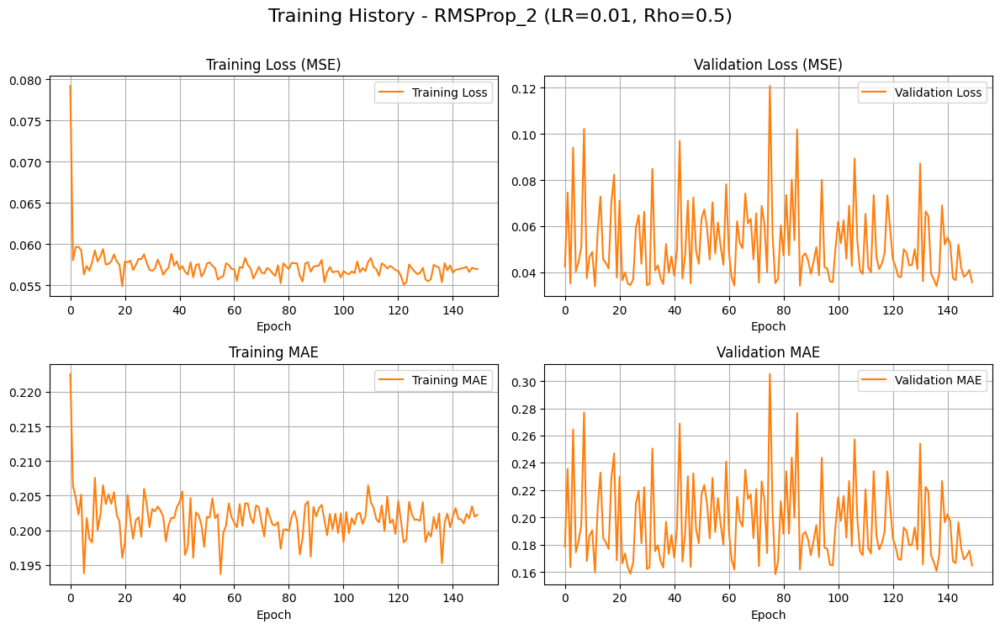

In [ ]:
plot_single_history(rms2, model_name="RMSProp_2 (LR=0.01, Rho=0.5)", index=1)

In [ ]:
rms3_model, rms3 = train_model(x_train, y_train,
                               x_valid, y_valid,
                               tf.keras.optimizers.RMSprop(
                                  learning_rate=0.001,
                                  rho=0.9), "rms_3")

Epoch 1/150
249/249 - 10s - 41ms/step - loss: 0.0611 - mae: 0.2054 - val_loss: 0.0406 - val_mae: 0.1747
Epoch 2/150
249/249 - 5s - 20ms/step - loss: 0.0579 - mae: 0.1992 - val_loss: 0.0702 - val_mae: 0.2297
Epoch 3/150
249/249 - 3s - 14ms/step - loss: 0.0572 - mae: 0.1999 - val_loss: 0.0563 - val_mae: 0.2045
Epoch 4/150
249/249 - 3s - 13ms/step - loss: 0.0564 - mae: 0.1992 - val_loss: 0.0556 - val_mae: 0.2032
Epoch 5/150
249/249 - 6s - 25ms/step - loss: 0.0552 - mae: 0.2007 - val_loss: 0.0675 - val_mae: 0.2246
Epoch 6/150
249/249 - 4s - 15ms/step - loss: 0.0566 - mae: 0.2006 - val_loss: 0.0618 - val_mae: 0.2147
Epoch 7/150
249/249 - 5s - 19ms/step - loss: 0.0556 - mae: 0.2020 - val_loss: 0.0368 - val_mae: 0.1669
Epoch 8/150
249/249 - 3s - 13ms/step - loss: 0.0540 - mae: 0.1939 - val_loss: 0.0535 - val_mae: 0.1992
Epoch 9/150
249/249 - 5s - 21ms/step - loss: 0.0555 - mae: 0.2010 - val_loss: 0.0510 - val_mae: 0.1947
Epoch 10/150
249/249 - 5s - 19ms/step - loss: 0.0555 - mae: 0.2008 - val

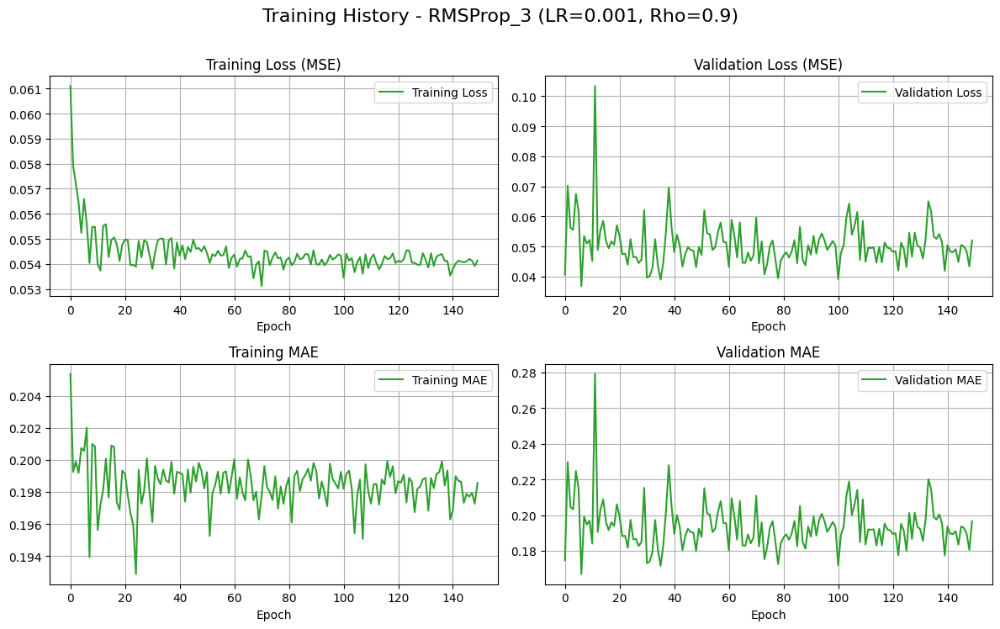

In [ ]:
plot_single_history(rms3, model_name="RMSProp_3 (LR=0.001, Rho=0.9)", index=2)

In [ ]:
rms4_model, rms4 = train_model(x_train, y_train,
                               x_valid, y_valid,
                               tf.keras.optimizers.RMSprop(
                                  learning_rate=0.001,
                                  rho=0.5), "rms_4")

Epoch 1/150
249/249 - 10s - 42ms/step - loss: 0.0637 - mae: 0.2096 - val_loss: 0.0881 - val_mae: 0.2564
Epoch 2/150
249/249 - 3s - 13ms/step - loss: 0.0605 - mae: 0.2011 - val_loss: 0.0401 - val_mae: 0.1738
Epoch 3/150
249/249 - 3s - 13ms/step - loss: 0.0591 - mae: 0.2026 - val_loss: 0.0522 - val_mae: 0.1970
Epoch 4/150
249/249 - 5s - 19ms/step - loss: 0.0579 - mae: 0.2027 - val_loss: 0.0538 - val_mae: 0.1999
Epoch 5/150
249/249 - 3s - 14ms/step - loss: 0.0576 - mae: 0.2027 - val_loss: 0.0450 - val_mae: 0.1834
Epoch 6/150
249/249 - 5s - 20ms/step - loss: 0.0578 - mae: 0.2025 - val_loss: 0.0681 - val_mae: 0.2261
Epoch 7/150
249/249 - 5s - 19ms/step - loss: 0.0598 - mae: 0.2033 - val_loss: 0.0432 - val_mae: 0.1797
Epoch 8/150
249/249 - 4s - 15ms/step - loss: 0.0593 - mae: 0.2054 - val_loss: 0.0596 - val_mae: 0.2107
Epoch 9/150
249/249 - 5s - 21ms/step - loss: 0.0580 - mae: 0.2012 - val_loss: 0.0576 - val_mae: 0.2069
Epoch 10/150
249/249 - 7s - 26ms/step - loss: 0.0577 - mae: 0.2023 - val

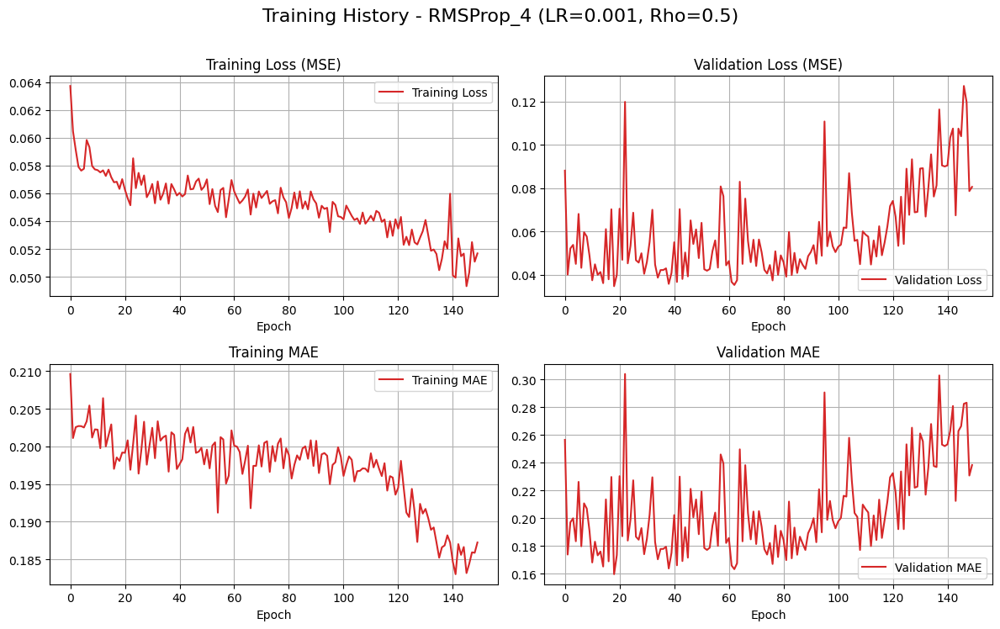

In [ ]:
plot_single_history(rms4, model_name="RMSProp_4 (LR=0.001, Rho=0.5)", index=3)

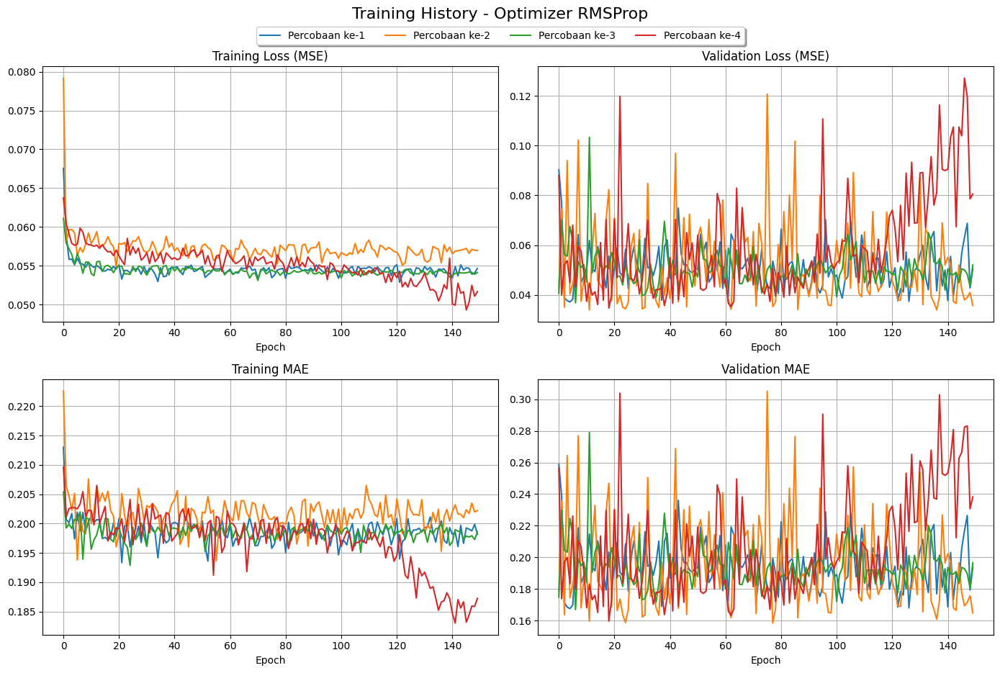

In [ ]:
histories = [rms1, rms2, rms3, rms4]
plot_train_history(histories, 'RMSProp')

Optimizer RMSProp menunjukkan konvergensi awal yang lebih cepat dibandingkan SGD. Konfigurasi dengan lr=0.001 (Percobaan 7 & 8) menunjukkan tren MAE pelatihan yang terus menurun, menandakan pembelajaran yang efektif.

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step
Successfully loaded and predicted with model: Percobaan 5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step
Successfully loaded and predicted with model: Percobaan 6
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
Successfully loaded and predicted with model: Percobaan 7
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step
Successfully loaded and predicted with model: Percobaan 8


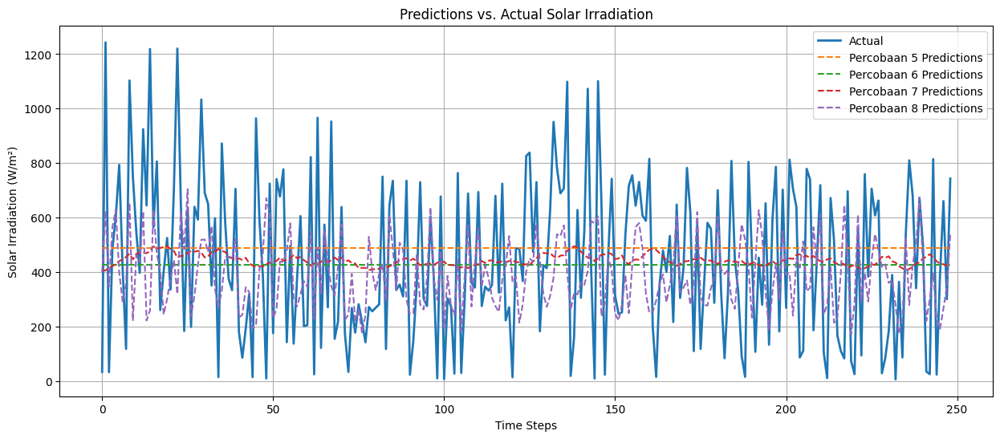

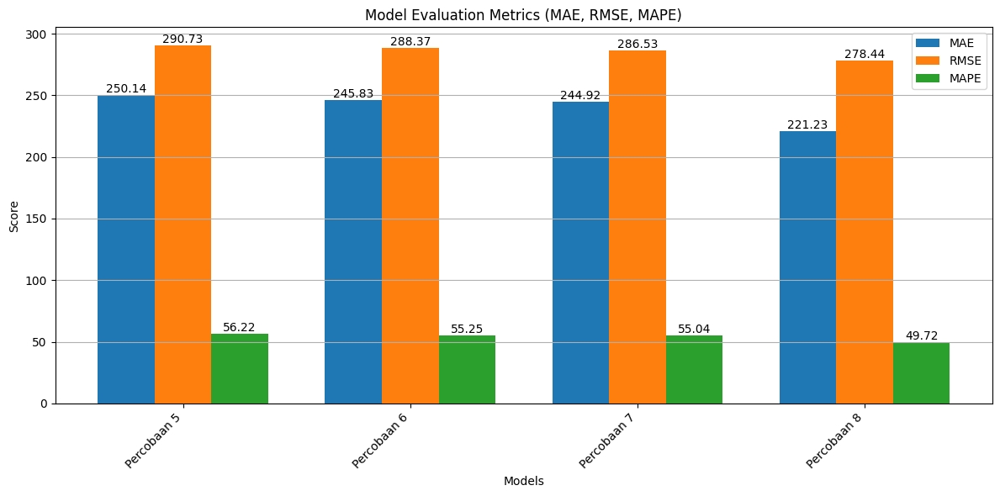

In [ ]:
# Contoh pemanggilan fungsi:
model_paths = {
    "Percobaan 5": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_rms_1.keras",
    "Percobaan 6": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_rms_2.keras",
    "Percobaan 7": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_rms_3.keras",
    "Percobaan 8": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_rms_4.keras"
}

predict_and_plot(model_paths, x_train, y_train, scaler)

Hasil evaluasi pada data latih menunjukkan keunggulan mutlak dari Percobaan 8 (lr=0.001, rho=0.5), yang mencatatkan nilai terendah di semua metrik: MAE 221.23, RMSE 278.44, dan MAPE 49.72%.

### 5.3 Pelatihan Model dengan Optimizer Adam

In [ ]:
adam1_model, adam1 = train_model(x_train, y_train,
                                 x_valid, y_valid,
                                 tf.keras.optimizers.Adam(
                                    learning_rate=0.01,
                                    beta_1=0.9,
                                    beta_2=0.99), "adam_1")

Epoch 1/150
249/249 - 12s - 48ms/step - loss: 0.0634 - mae: 0.2115 - val_loss: 0.0597 - val_mae: 0.2108
Epoch 2/150
249/249 - 3s - 14ms/step - loss: 0.0579 - mae: 0.2026 - val_loss: 0.0748 - val_mae: 0.2360
Epoch 3/150
249/249 - 4s - 15ms/step - loss: 0.0570 - mae: 0.2016 - val_loss: 0.0368 - val_mae: 0.1668
Epoch 4/150
249/249 - 6s - 22ms/step - loss: 0.0584 - mae: 0.2023 - val_loss: 0.0553 - val_mae: 0.2027
Epoch 5/150
249/249 - 3s - 13ms/step - loss: 0.0549 - mae: 0.1993 - val_loss: 0.0700 - val_mae: 0.2285
Epoch 6/150
249/249 - 5s - 22ms/step - loss: 0.0556 - mae: 0.2013 - val_loss: 0.0669 - val_mae: 0.2232
Epoch 7/150
249/249 - 5s - 18ms/step - loss: 0.0542 - mae: 0.1959 - val_loss: 0.0588 - val_mae: 0.2092
Epoch 8/150
249/249 - 4s - 15ms/step - loss: 0.0550 - mae: 0.2003 - val_loss: 0.0545 - val_mae: 0.2010
Epoch 9/150
249/249 - 5s - 20ms/step - loss: 0.0542 - mae: 0.1973 - val_loss: 0.0444 - val_mae: 0.1825
Epoch 10/150
249/249 - 5s - 19ms/step - loss: 0.0547 - mae: 0.2004 - val

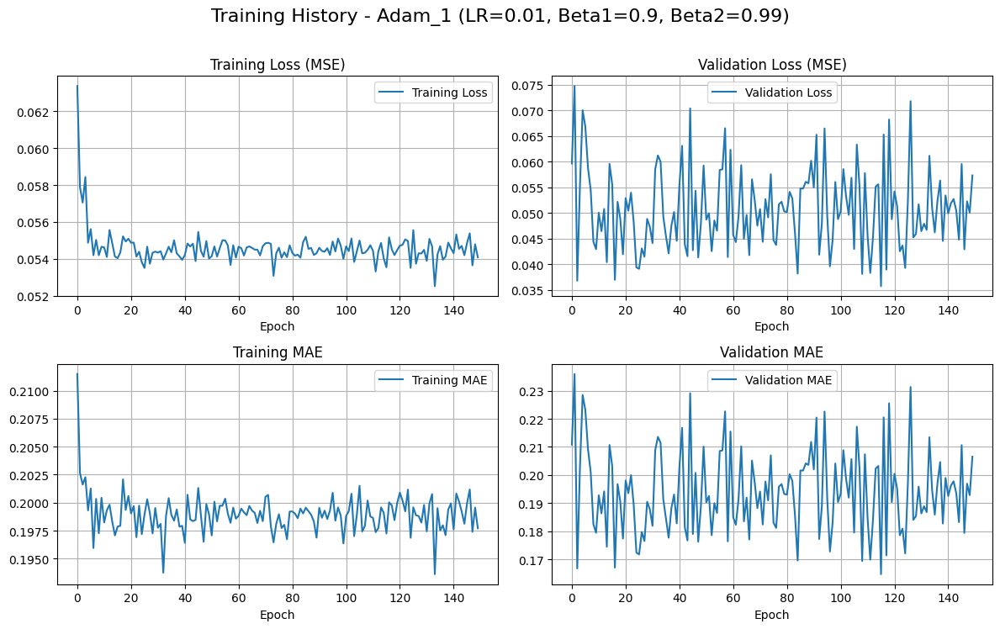

In [ ]:
plot_single_history(adam1, model_name="Adam_1 (LR=0.01, Beta1=0.9, Beta2=0.99)", index=0)

In [ ]:
adam2_model, adam2 = train_model(x_train, y_train,
                                 x_valid, y_valid,
                                 tf.keras.optimizers.Adam(
                                    learning_rate=0.01,
                                    beta_1=0.5,
                                    beta_2=0.85), "adam_2")

Epoch 1/150
249/249 - 10s - 42ms/step - loss: 0.0664 - mae: 0.2090 - val_loss: 0.0929 - val_mae: 0.2627
Epoch 2/150
249/249 - 4s - 15ms/step - loss: 0.0568 - mae: 0.2037 - val_loss: 0.0509 - val_mae: 0.1945
Epoch 3/150
249/249 - 5s - 19ms/step - loss: 0.0555 - mae: 0.1997 - val_loss: 0.0832 - val_mae: 0.2482
Epoch 4/150
249/249 - 7s - 28ms/step - loss: 0.0539 - mae: 0.1947 - val_loss: 0.0389 - val_mae: 0.1715
Epoch 5/150
249/249 - 3s - 13ms/step - loss: 0.0550 - mae: 0.1969 - val_loss: 0.0465 - val_mae: 0.1865
Epoch 6/150
249/249 - 5s - 21ms/step - loss: 0.0567 - mae: 0.2013 - val_loss: 0.0546 - val_mae: 0.2012
Epoch 7/150
249/249 - 7s - 26ms/step - loss: 0.0557 - mae: 0.2006 - val_loss: 0.0475 - val_mae: 0.1882
Epoch 8/150
249/249 - 4s - 14ms/step - loss: 0.0566 - mae: 0.2043 - val_loss: 0.0438 - val_mae: 0.1813
Epoch 9/150
249/249 - 5s - 21ms/step - loss: 0.0551 - mae: 0.2003 - val_loss: 0.0478 - val_mae: 0.1887
Epoch 10/150
249/249 - 6s - 23ms/step - loss: 0.0558 - mae: 0.2014 - val

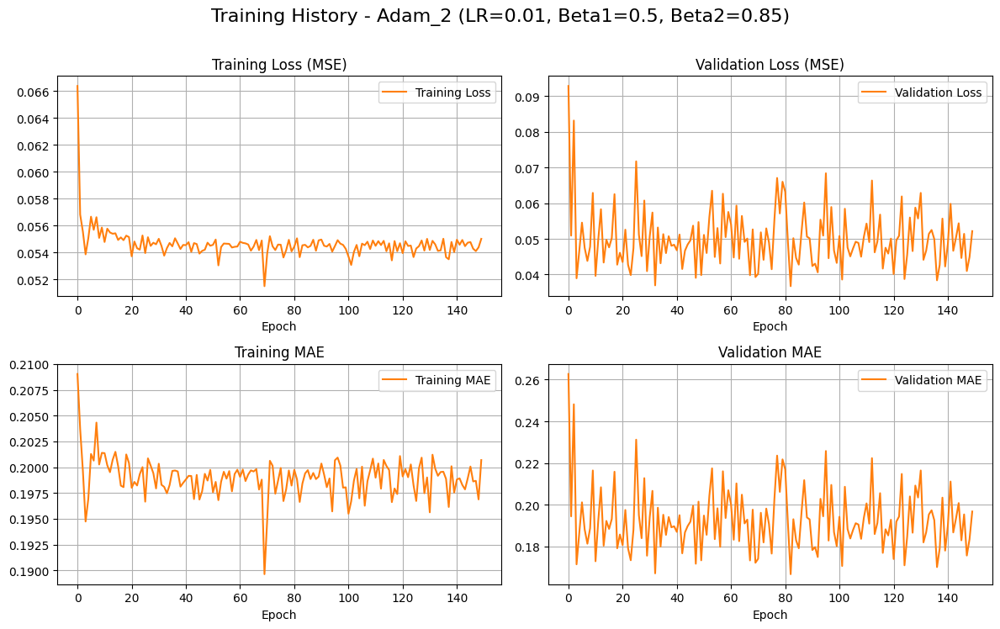

In [ ]:
plot_single_history(adam2, model_name="Adam_2 (LR=0.01, Beta1=0.5, Beta2=0.85)", index=1)

In [ ]:
adam3_model, adam3 = train_model(x_train, y_train,
                                 x_valid, y_valid,
                                 tf.keras.optimizers.Adam(
                                    learning_rate=0.001,
                                    beta_1=0.9,
                                    beta_2=0.99), "adam_3")

Epoch 1/150
249/249 - 10s - 42ms/step - loss: 0.0682 - mae: 0.2160 - val_loss: 0.0352 - val_mae: 0.1641
Epoch 2/150
249/249 - 8s - 34ms/step - loss: 0.0553 - mae: 0.2007 - val_loss: 0.0471 - val_mae: 0.1877
Epoch 3/150
249/249 - 3s - 13ms/step - loss: 0.0559 - mae: 0.2010 - val_loss: 0.0461 - val_mae: 0.1858
Epoch 4/150
249/249 - 6s - 24ms/step - loss: 0.0547 - mae: 0.2007 - val_loss: 0.0530 - val_mae: 0.1982
Epoch 5/150
249/249 - 3s - 13ms/step - loss: 0.0559 - mae: 0.2019 - val_loss: 0.0517 - val_mae: 0.1959
Epoch 6/150
249/249 - 5s - 21ms/step - loss: 0.0559 - mae: 0.2004 - val_loss: 0.0436 - val_mae: 0.1808
Epoch 7/150
249/249 - 6s - 23ms/step - loss: 0.0545 - mae: 0.1983 - val_loss: 0.0495 - val_mae: 0.1917
Epoch 8/150
249/249 - 5s - 19ms/step - loss: 0.0547 - mae: 0.1973 - val_loss: 0.0539 - val_mae: 0.1999
Epoch 9/150
249/249 - 7s - 27ms/step - loss: 0.0538 - mae: 0.1961 - val_loss: 0.0424 - val_mae: 0.1784
Epoch 10/150
249/249 - 9s - 35ms/step - loss: 0.0556 - mae: 0.2006 - val

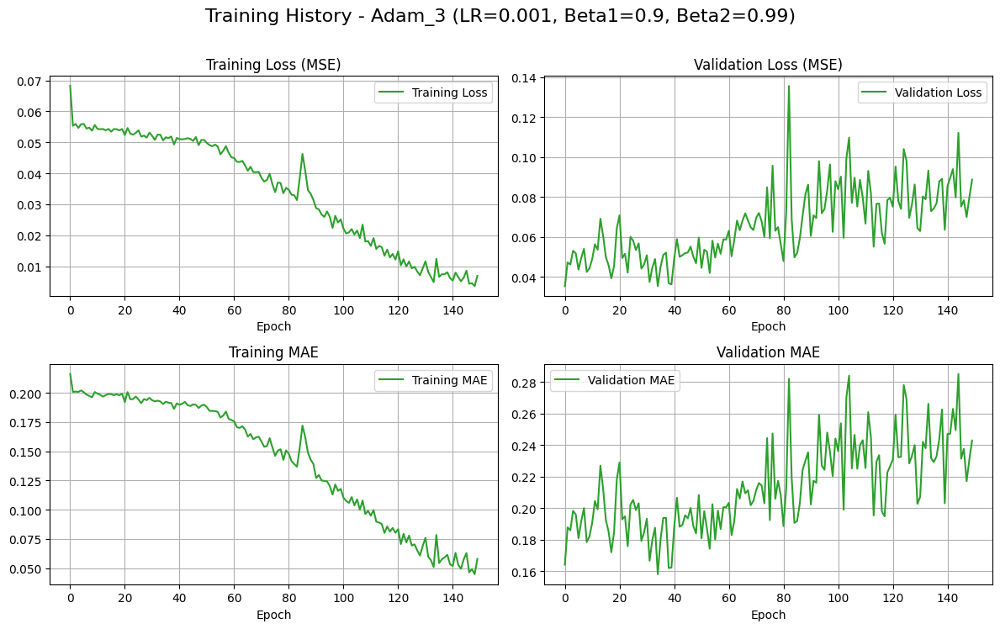

In [ ]:
plot_single_history(adam3, model_name="Adam_3 (LR=0.001, Beta1=0.9, Beta2=0.99)", index=2)

In [ ]:
adam4_model, adam4 = train_model(x_train, y_train,
                                 x_valid, y_valid,
                                 tf.keras.optimizers.Adam(
                                    learning_rate=0.001,
                                    beta_1=0.5,
                                    beta_2=0.85), "adam_4")

Epoch 1/150
249/249 - 11s - 45ms/step - loss: 0.0644 - mae: 0.2092 - val_loss: 0.0485 - val_mae: 0.1901
Epoch 2/150
249/249 - 3s - 13ms/step - loss: 0.0583 - mae: 0.2006 - val_loss: 0.0399 - val_mae: 0.1734
Epoch 3/150
249/249 - 5s - 20ms/step - loss: 0.0577 - mae: 0.2029 - val_loss: 0.0440 - val_mae: 0.1816
Epoch 4/150
249/249 - 3s - 13ms/step - loss: 0.0559 - mae: 0.1987 - val_loss: 0.0384 - val_mae: 0.1700
Epoch 5/150
249/249 - 5s - 20ms/step - loss: 0.0571 - mae: 0.2054 - val_loss: 0.0572 - val_mae: 0.2064
Epoch 6/150
249/249 - 6s - 26ms/step - loss: 0.0561 - mae: 0.2004 - val_loss: 0.0606 - val_mae: 0.2125
Epoch 7/150
249/249 - 4s - 15ms/step - loss: 0.0555 - mae: 0.2001 - val_loss: 0.0625 - val_mae: 0.2159
Epoch 8/150
249/249 - 3s - 13ms/step - loss: 0.0547 - mae: 0.2011 - val_loss: 0.0529 - val_mae: 0.1981
Epoch 9/150
249/249 - 7s - 26ms/step - loss: 0.0554 - mae: 0.1998 - val_loss: 0.0390 - val_mae: 0.1715
Epoch 10/150
249/249 - 4s - 15ms/step - loss: 0.0547 - mae: 0.1964 - val

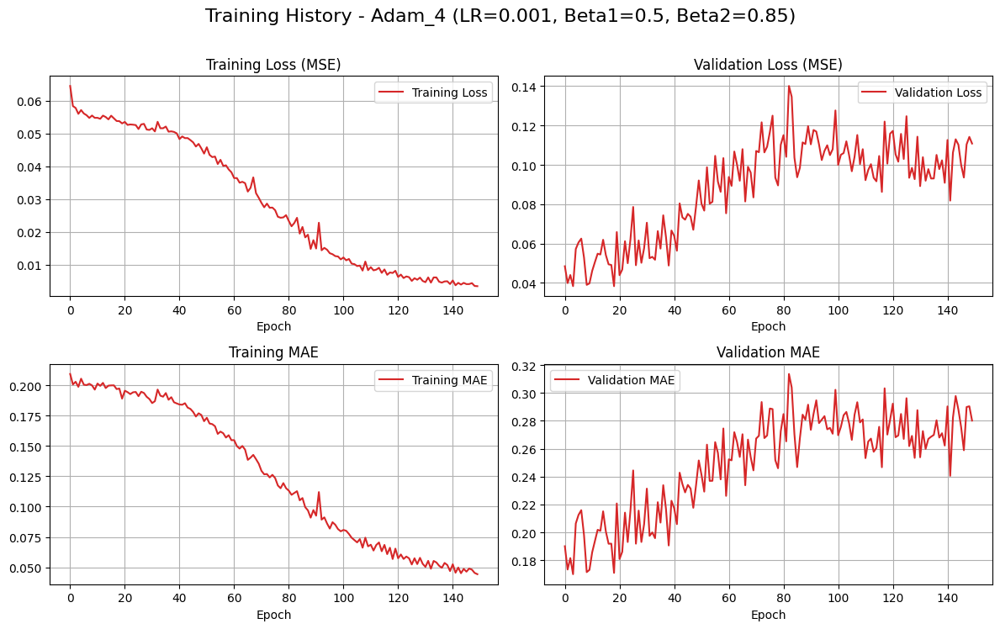

In [ ]:
plot_single_history(adam4, model_name="Adam_4 (LR=0.001, Beta1=0.5, Beta2=0.85)", index=3)

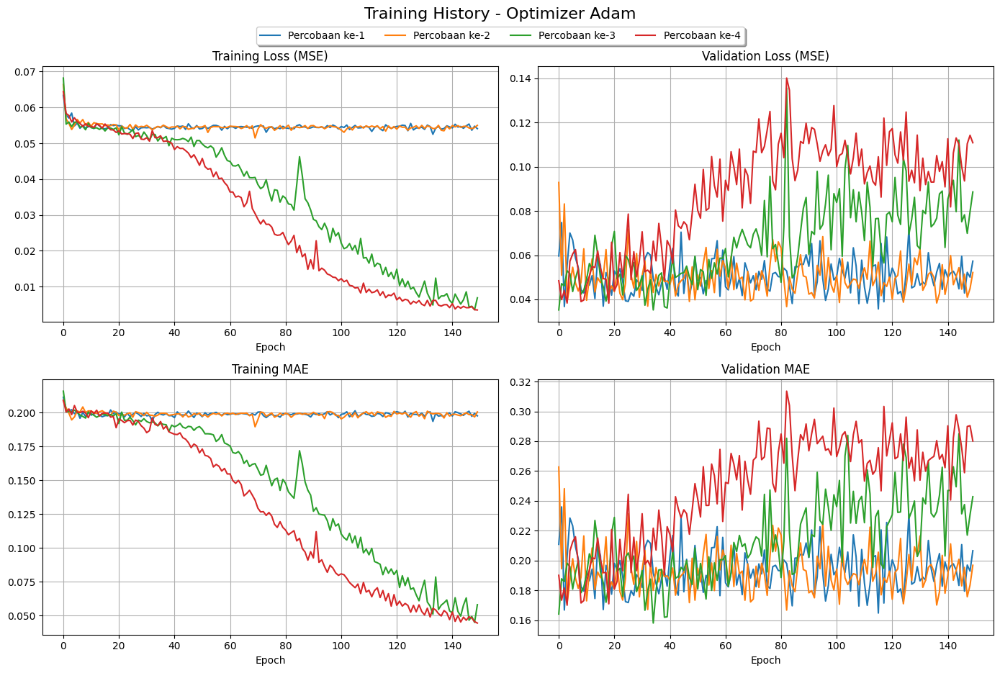

In [ ]:
histories = [adam1, adam2, adam3, adam4]
plot_train_history(histories, "Adam")

Terdapat perbedaan kontras berdasarkan learning rate. Konfigurasi lr=0.01 (Percobaan 9 & 10) stagnan pada error tinggi. Sebaliknya, konfigurasi lr=0.001 (Percobaan 11 & 12) menunjukkan kurva loss yang terus menurun secara konsisten, menandakan proses pembelajaran yang sangat efektif.



8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step
Successfully loaded and predicted with model: Percobaan 9
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step
Successfully loaded and predicted with model: Percobaan 10
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step
Successfully loaded and predicted with model: Percobaan 11
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step
Successfully loaded and predicted with model: Percobaan 12


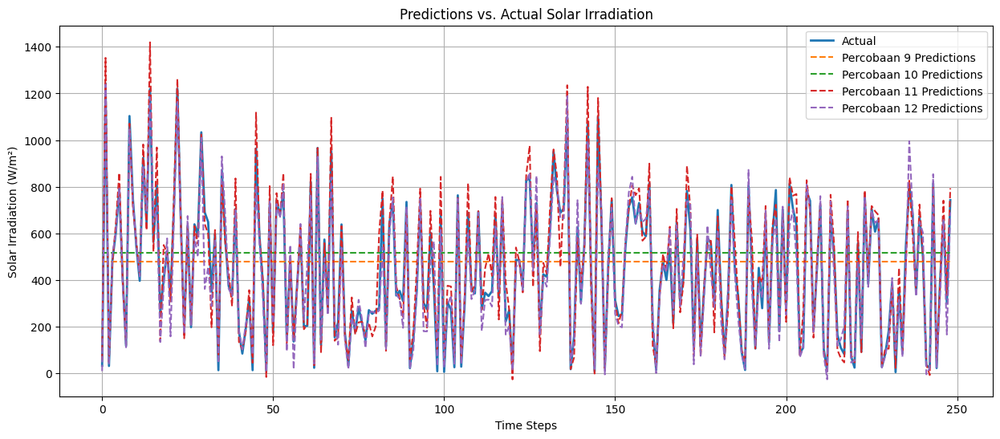

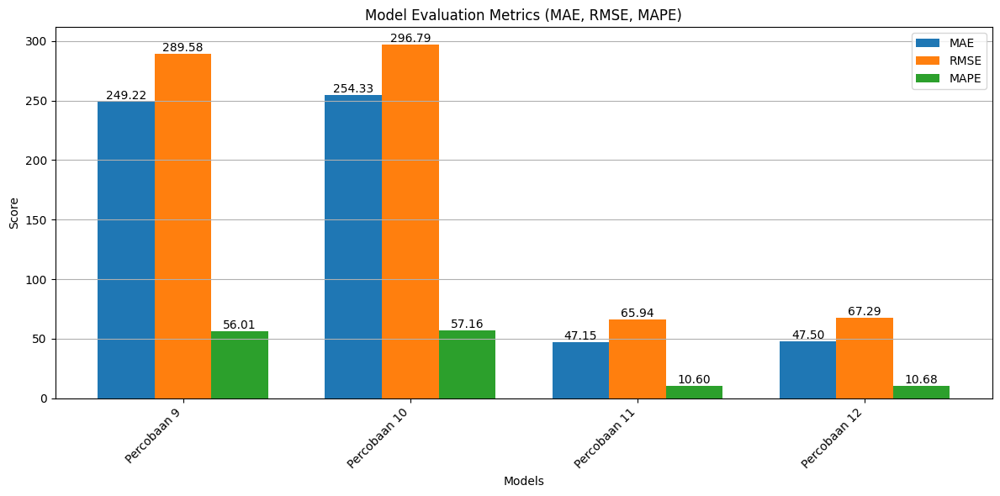

In [ ]:
# Contoh pemanggilan fungsi:
model_paths = {
    "Percobaan 9": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_1.keras",
    "Percobaan 10": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_2.keras",
    "Percobaan 11": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_3.keras",
    "Percobaan 12": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_4.keras"
}
predict_and_plot(model_paths, x_train, y_train, scaler)

Konfigurasi Adam lr=0.001 (Percobaan 11 & 12) menunjukkan performa yang sangat superior. Percobaan 11 sedikit lebih unggul dengan MAE 47.15 dan RMSE 65.94. Karena performa keduanya sangat baik dan berdekatan, keduanya dipilih untuk evaluasi final.

## 6. Pemilihan Model Terbaik
Tahap final ini bertujuan untuk menentukan konfigurasi model terbaik secara keseluruhan. Model-model perwakilan yang berkinerja unggul dari setiap kelompok optimizer (SGD, RMSProp, dan Adam) dipilih dari fase pelatihan. Selanjutnya, performa generalisasi dari model-model finalis ini diuji dan dibandingkan pada data uji (test set) untuk memilih satu model pemenang yang paling andal.

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 717ms/step
Successfully loaded and predicted with model: Percobaan 1


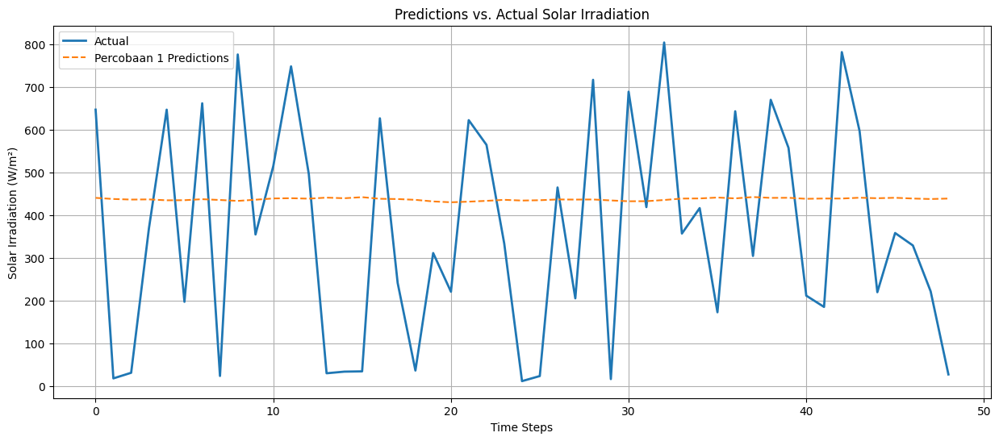

In [ ]:
model_paths = {
    "Percobaan 1": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_sgd_1.keras",
}
predict_and_plot(model_paths, x_test, y_test, scaler)

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 602ms/step
Successfully loaded and predicted with model: Percobaan 8


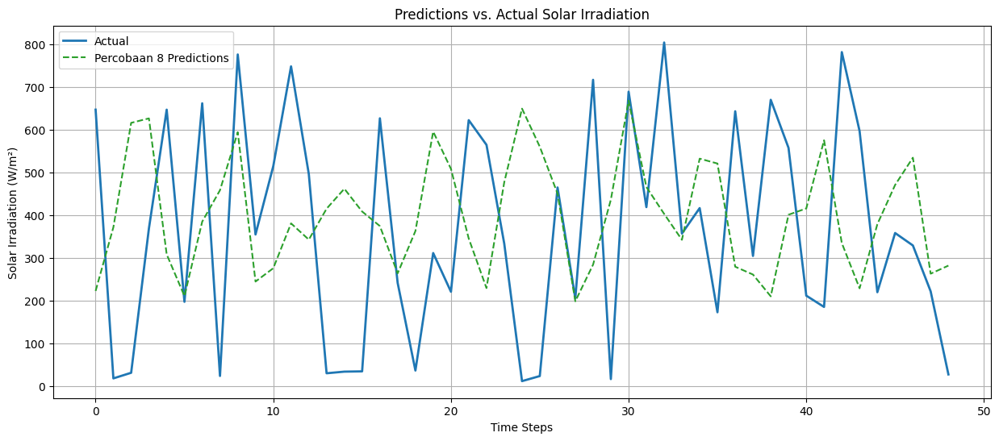

In [ ]:
model_paths = {
    "Percobaan 8": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_rms_4.keras",
}
predict_and_plot(model_paths, x_test, y_test, scaler)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step
Successfully loaded and predicted with model: Percobaan 11


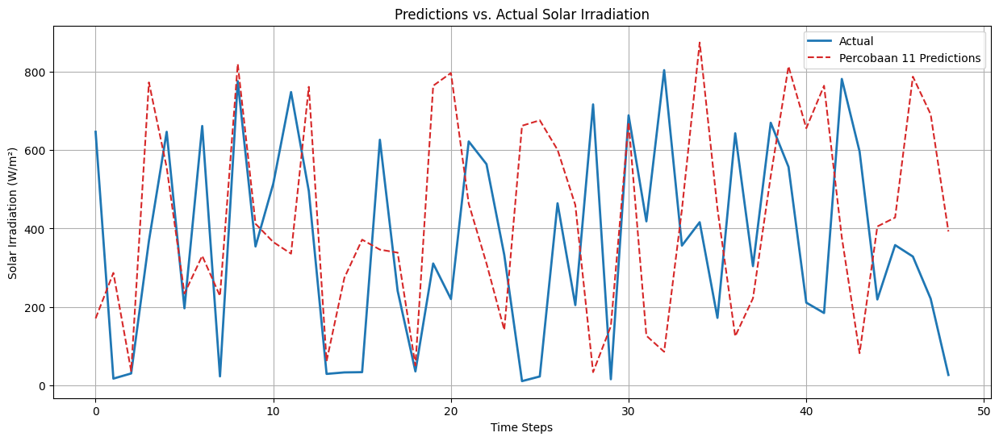

In [ ]:
model_paths = {
    "Percobaan 11": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_3.keras",
}
predict_and_plot(model_paths, x_test, y_test, scaler)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 752ms/step
Successfully loaded and predicted with model: Percobaan 12


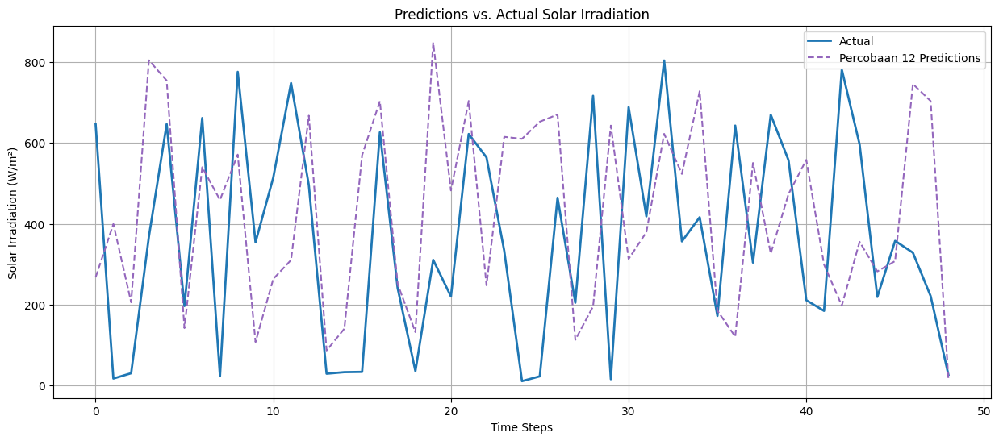

In [ ]:
model_paths = {
    "Percobaan 12": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_4.keras",
}
predict_and_plot(model_paths, x_test, y_test, scaler)

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 895ms/step
Successfully loaded and predicted with model: Percobaan 1
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 488ms/step
Successfully loaded and predicted with model: Percobaan 8
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step
Successfully loaded and predicted with model: Percobaan 11
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step
Successfully loaded and predicted with model: Percobaan 12


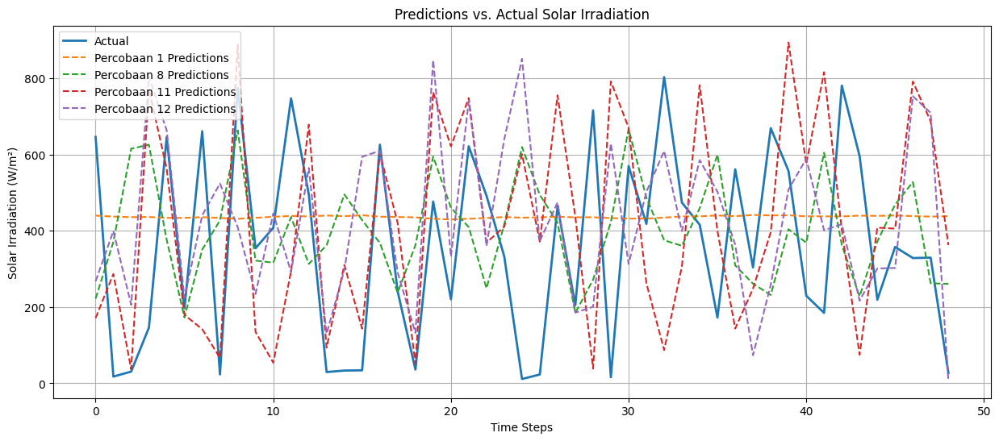

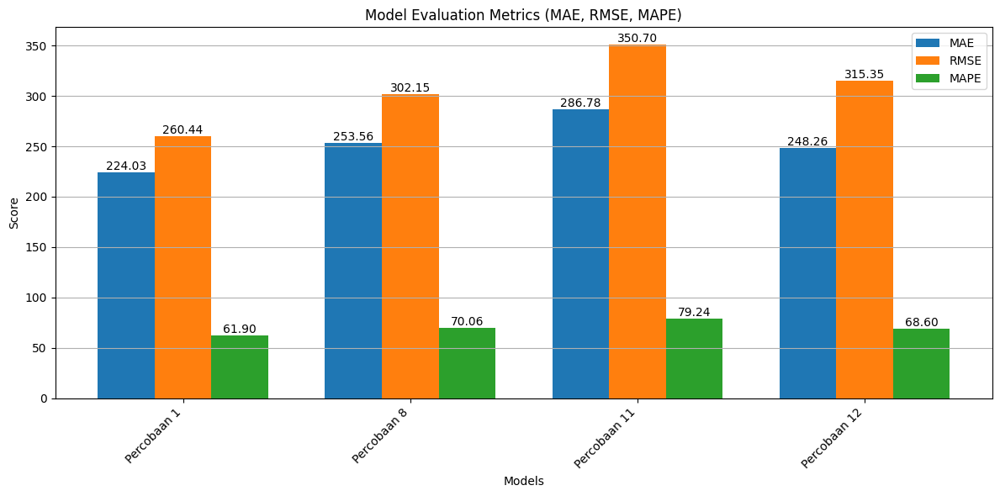

In [ ]:
model_paths = {
    "Percobaan 1": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_sgd_1.keras",
    "Percobaan 8": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_rms_4.keras",
    "Percobaan 11": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_3.keras",
    "Percobaan 12": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_4.keras",
}
predict_and_plot(model_paths, x_test, y_test, scaler)

Evaluasi final pada data uji menunjukkan hasil yang menarik. Secara kuantitatif, Percobaan 1 (SGD) secara tak terduga menghasilkan nilai MAE (224.03) dan RMSE (260.44) terendah. Namun, analisis kualitatif pada plot prediksi menunjukkan model SGD cenderung underfitting dan gagal menangkap dinamika data. Sebaliknya, Percobaan 12 (Adam), meskipun metriknya sedikit lebih tinggi, terbukti paling mampu mengikuti fluktuasi data aktual. Oleh karena itu, berdasarkan keseimbangan antara metrik kuantitatif yang baik dan kemampuan generalisasi kualitatif yang unggul, Percobaan 12 (Adam) dipilih sebagai model terbaik secara keseluruhan.

## 7. Tambahan Analisis

Sebagai uji coba tambahan, model terbaik yang telah dipilih dari hasil evaluasi sebelumnya diuji kemampuannya pada dataset yang sama sekali baru (Data_Pagi_Processed.xlsx). Pengujian ini bertujuan untuk menilai seberapa robust dan adaptif model tersebut ketika dihadapkan pada data dengan karakteristik yang sedikit berbeda (data pengukuran pagi hari), yang dapat memberikan gambaran mengenai performanya dalam skenario dunia nyata.

###7.1. Mencoba model untuk memprediksi dataset baru

Bagian ini menguji kemampuan model terbaik dalam memprediksi data iradiasi matahari dari dataset yang berbeda (Data Pagi) untuk menilai kemampuan generalisasinya.

1.  **Memuat Data Baru**: Membaca data dari file Excel `Data_Pagi_Processed.xlsx` ke dalam DataFrame baru.
2.  **Pra-pemrosesan Data Baru**: Melakukan langkah-langkah pra-pemrosesan yang sama seperti pada data pelatihan (subsetting, penanganan missing value, konversi Lux ke Iradiasi, penghapusan kolom tidak relevan). **Penting**: Melakukan normalisasi data baru menggunakan *scaler yang sama* yang sudah difit pada data pelatihan.
3.  **Mempersiapkan Input Model**: Membuat urutan input (windows) dari data baru yang diskalakan, sesuai dengan `Window_Size` yang digunakan saat pelatihan model (7 hari).
4.  **Memuat Model Terbaik**: Memuat model terbaik yang telah disimpan sebelumnya dari file `.keras`.
5.  **Melakukan Prediksi**: Menggunakan model yang dimuat untuk memprediksi nilai iradiasi matahari pada data baru.
6.  **Inverse Transform Prediksi**: Mengembalikan hasil prediksi yang dinormalisasi ke skala aslinya menggunakan `scaler.inverse_transform`.
7.  **Visualisasi Hasil**: Membuat plot deret waktu yang membandingkan nilai iradiasi matahari aktual dari data baru dengan nilai prediksi dari model.
8.  **Evaluasi pada Data Baru**: Menggunakan fungsi `predict_and_plot` untuk mengevaluasi performa model terbaik pada data baru menggunakan metrik MAE, RMSE, dan MAPE.

In [ ]:
# Tambahan - Mempersiapkan Data Baru untuk Prediksi
# Memuat data baru
df_new = pd.read_excel('/content/drive/MyDrive/Tugas_Akhir/Data_Pagi_Processed.xlsx', index_col='Tanggal', parse_dates=True)

# Mengambil subset data di mana 'Sudut' adalah 75 (sesuaikan jika data baru memiliki sudut lain)
df_new_75 = df_new.query('Sudut == 75').copy()

# Menangani missing value pada data baru
df_new_75 = fill_missing_lux(df_new_75) # Gunakan fungsi fill_missing_lux yang sudah ada

# Konversi Lux ke Iradiasi Matahari dan seleksi fitur pada data baru
df_new_75['SolarIrradiation'] = df_new_75['Lux'].apply(lux_to_solar_irradiation)
df_new_75 = df_new_75.drop(['No', 'Bulan', 'Sudut', 'Tampak', 'Cuaca', 'Lux'], axis=1)

# Normalisasi data baru menggunakan scaler yang sudah dilatih pada data asli
# PENTING: Gunakan scaler yang SAMA (fit_transform HANYA pada data latih asli)
df_new_75['SolarIrradiation_normalized'] = scaler.transform(df_new_75[['SolarIrradiation']])

# Mempersiapkan input model dari data baru yang sudah dinormalisasi
# Data baru akan menjadi input (X) dan nilai aktualnya akan menjadi target (y) untuk evaluasi
x_new, y_new = create_windowed_dataset(df_new_75['SolarIrradiation_normalized'], Window_Size)

print("\n--- Hasil Setelah Windowing (Data Baru) ---")
print(f"Bentuk X_new (input data baru): {x_new.shape}")
print(f"Bentuk y_new (output data baru - untuk perbandingan): {y_new.shape}")


--- Hasil Setelah Windowing (Data Baru) ---
Bentuk X_new (input data baru): (359, 7)
Bentuk y_new (output data baru - untuk perbandingan): (359,)


12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step
Successfully loaded and predicted with model: Percobaan 1
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step
Successfully loaded and predicted with model: Percobaan 8
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step
Successfully loaded and predicted with model: Percobaan 11
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step
Successfully loaded and predicted with model: Percobaan 12


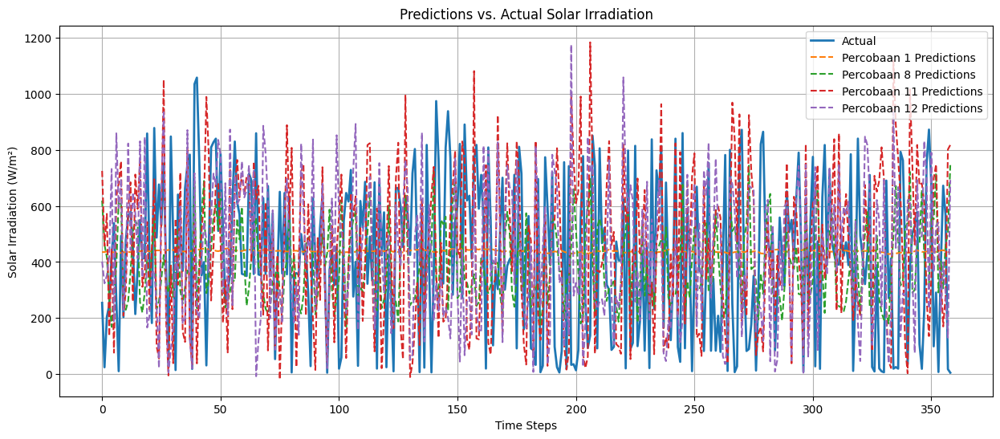

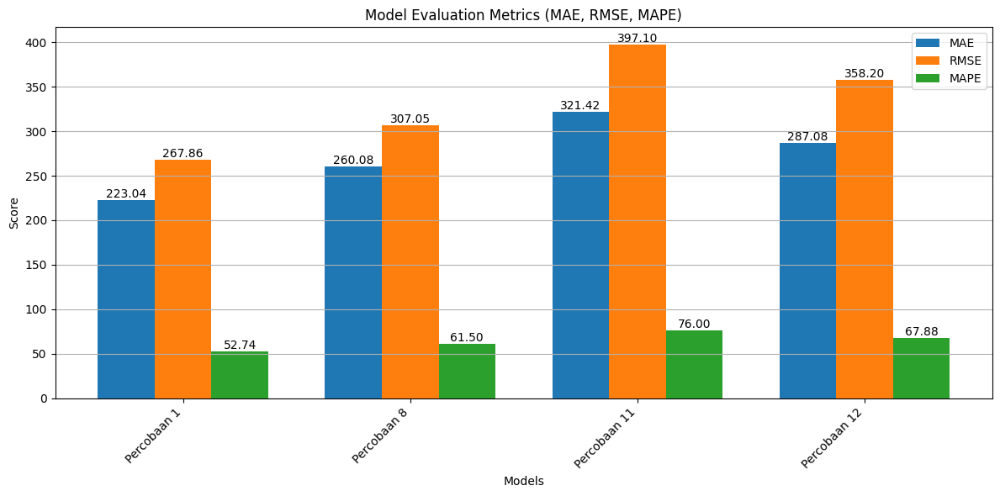

In [ ]:
# Contoh pemanggilan fungsi:
model_paths = {
    "Percobaan 1": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_sgd_1.keras",
    "Percobaan 8": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_rms_4.keras",
    "Percobaan 11": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_3.keras",
    "Percobaan 12": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_4.keras"
}

predict_and_plot(model_paths, x_new, y_new, scaler)

12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step
Successfully loaded and predicted with model: Percobaan 1


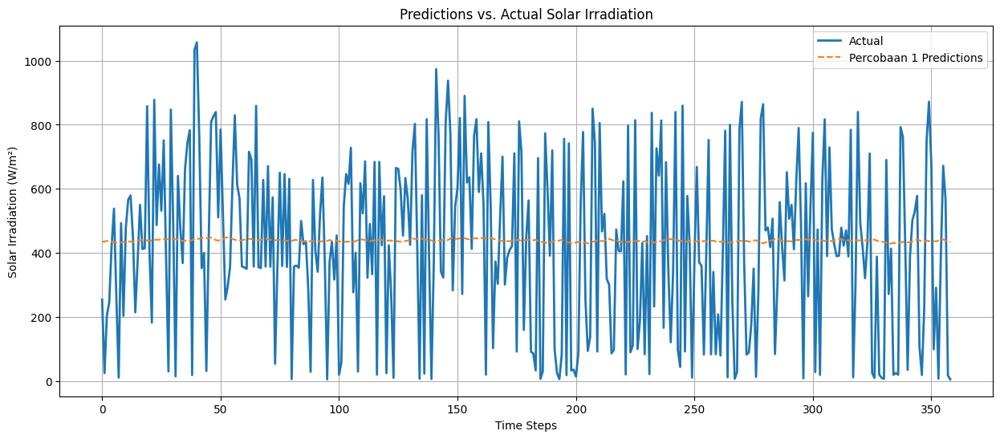

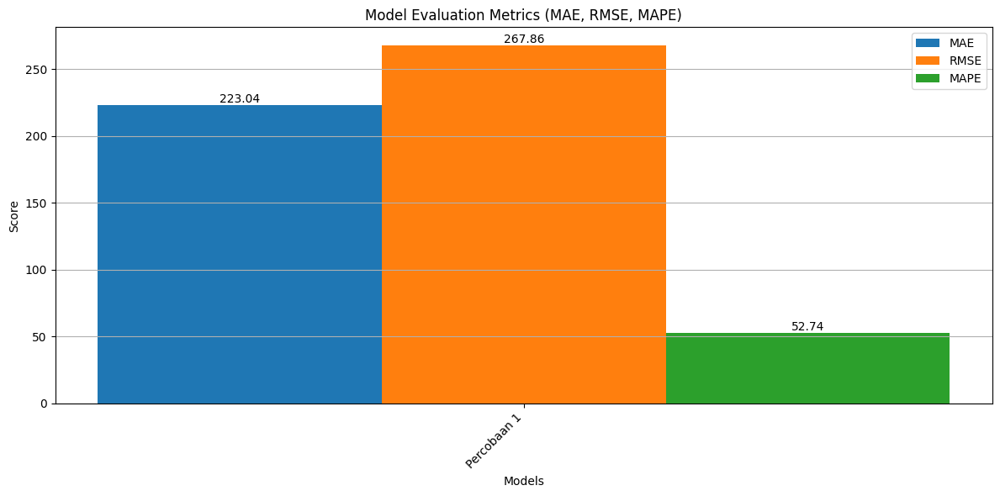

In [ ]:
# Contoh pemanggilan fungsi:
model_paths = {
    "Percobaan 1": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_sgd_1.keras",
}

predict_and_plot(model_paths, x_new, y_new, scaler)

12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step
Successfully loaded and predicted with model: Percobaan 8


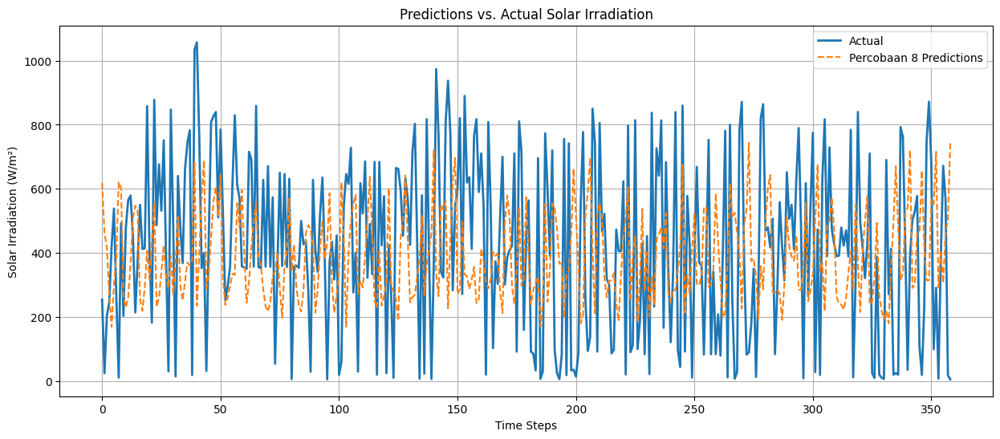

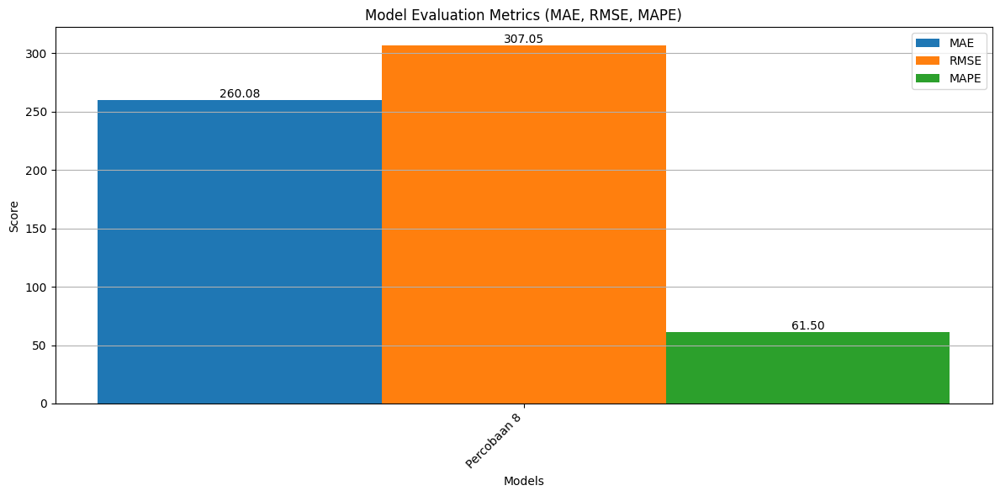

In [ ]:
# Contoh pemanggilan fungsi:
model_paths = {
    "Percobaan 8": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_rms_4.keras",
}

predict_and_plot(model_paths, x_new, y_new, scaler)

12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step
Successfully loaded and predicted with model: Percobaan 11


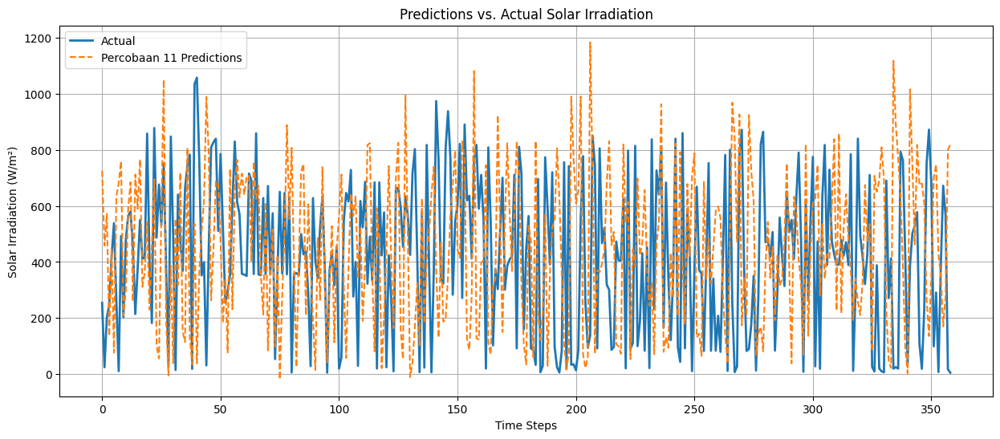

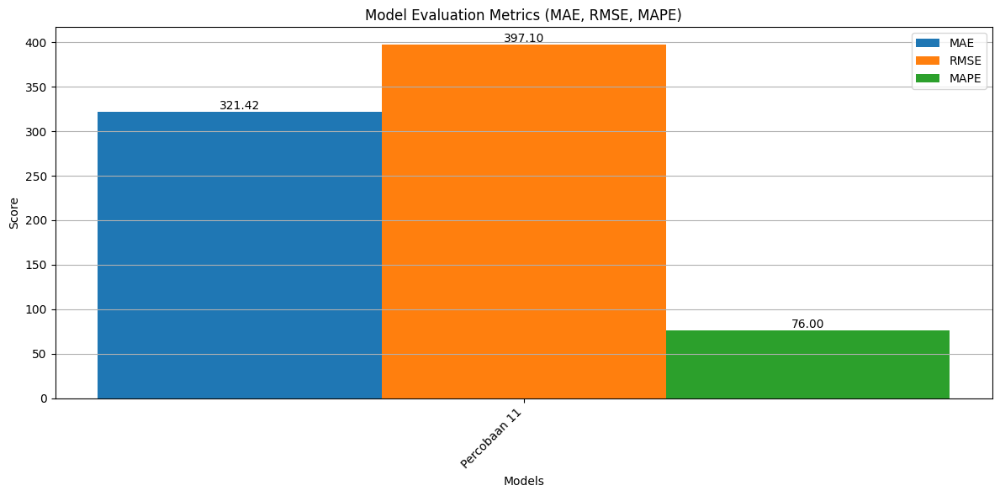

In [ ]:
# Contoh pemanggilan fungsi:
model_paths = {
    "Percobaan 11": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_3.keras",
}

predict_and_plot(model_paths, x_new, y_new, scaler)

12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step
Successfully loaded and predicted with model: Percobaan 12


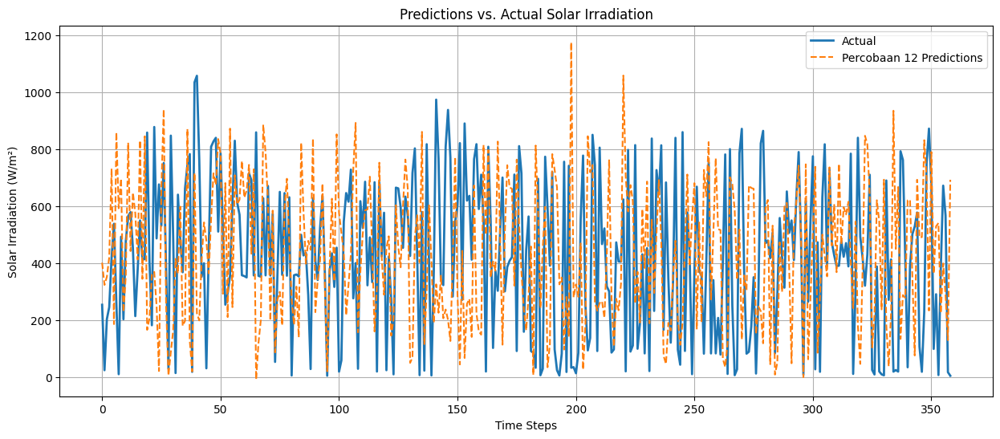

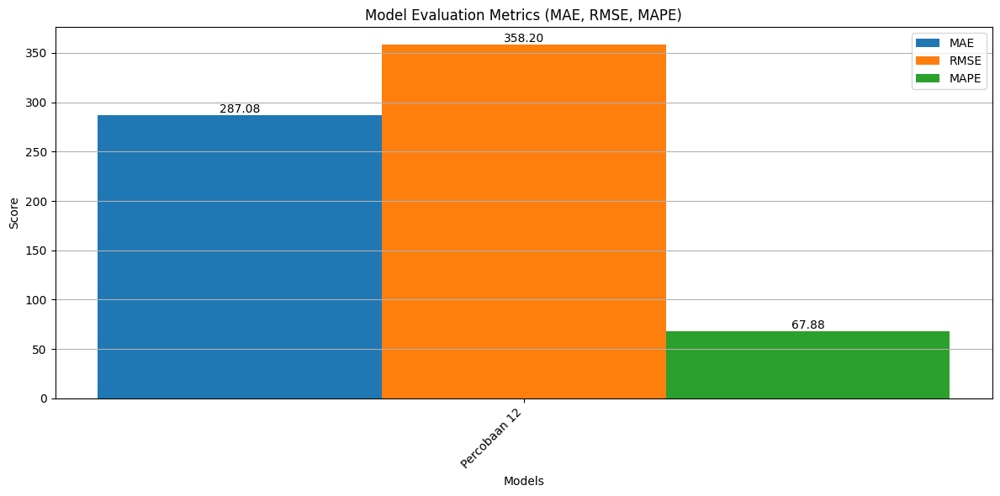

In [ ]:
# Contoh pemanggilan fungsi:
model_paths = {
    "Percobaan 12": "/content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/best_adam_4.keras",
}

predict_and_plot(model_paths, x_new, y_new, scaler)

###7.2 Visualisasi Pelatihan dengan TensorBoard

Bagian ini menggunakan TensorBoard untuk memvisualisasikan metrik pelatihan (loss dan MAE) yang dicatat selama proses pelatihan model.

1.  **Memuat Ekstensi TensorBoard (`%reload_ext tensorboard`)**: Memuat ulang ekstensi TensorBoard di Google Colab.
2.  **Menjalankan TensorBoard (`%tensorboard --logdir`)**: Menggunakan magic command `%tensorboard` untuk menjalankan TensorBoard. Argumen `--logdir` diikuti dengan path folder tempat log pelatihan disimpan. TensorBoard akan membaca file log di folder ini dan menampilkan grafik metrik pelatihan secara interaktif, memungkinkan Anda membandingkan performa model dari berbagai percobaan optimizer.

In [ ]:
# Load the TensorBoard notebook extension
%reload_ext tensorboard
!rm -rf ./logs/
%tensorboard --logdir /content/drive/MyDrive/Tugas_Akhir/Model/LSTM/4/

Reusing TensorBoard on port 6006 (pid 63281), started 1:44:43 ago. (Use '!kill 63281' to kill it.)

<IPython.core.display.Javascript object>